# Installs

In [146]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [147]:
!pip3 install --upgrade pip

In [148]:
#
# FAISS has to be installed from conda: we need CondaColab
#
!pip install -q condacolab
import condacolab
condacolab.install()

✨🍰✨ Everything looks OK!


In [149]:
#
# Install FAISS
#
!conda install pytorch::faiss-gpu

Channels:
 - conda-forge
 - pytorch
Platform: linux-64
Solving environment: / - \ | done


==> WARNING: A newer version of conda exists. <==
    current version: 23.11.0
    latest version: 24.7.1

Please update conda by running

    $ conda update -n base -c conda-forge conda



# All requested packages already installed.



In [150]:
#
# cd to the DiRe install directory
#
%cd drive/MyDrive/Colab\ Notebooks/DiRe-JAX

[Errno 2] No such file or directory: 'drive/MyDrive/Colab Notebooks/DiRe-JAX'
/content/drive/MyDrive/Colab Notebooks/DiRe-JAX


In [151]:
#
# Installing DiRe requirements
#
!pip install -r requirements_gpu.txt

In [152]:
#
# Doing some maintenance work (remove when becomes obsolete)
#
!pip install --upgrade cffi==1.17.1

In [153]:
#
# Benchmark-specific installs
#
!pip install CytofDR
!pip install PyCytoData
!pip install umap-learn
!git clone https://github.com/rapidsai/rapidsai-csp-utils.git
!python rapidsai-csp-utils/colab/pip-install.py

  Using cached pandas-2.0.3-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (18 kB)
Using cached pandas-2.0.3-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (12.3 MB)
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.1
    Uninstalling pandas-2.2.1:
      Successfully uninstalled pandas-2.2.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
xarray 2024.9.0 requires pandas>=2.1, but you have pandas 2.0.3 which is incompatible.
fatal: destination path 'rapidsai-csp-utils' already exists and is not an empty directory.
Installing RAPIDS remaining 24.4.* libraries
Looking in indexes: https://pypi.org/simple, https://pypi.nvidia.com
  Using cached pandas-2.2.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (19 kB)
Using cached pandas-2.2.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_

# Imports

In [154]:
#
# cd to the DiRe install directory
#
%cd /content/drive/MyDrive/Colab Notebooks/DiRe-JAX

/content/drive/MyDrive/Colab Notebooks/DiRe-JAX


In [155]:
#
# Imports
#
from dire_jax.dire import *
from dire_jax.dire_utils import *
from jax import random

In [156]:
#
# Benchmark-specific imports
#
from umap import UMAP
from cuml import UMAP as cUMAP
from cuml import TSNE as cTSNE
from PyCytoData import DataLoader

In [157]:
#
# Plotly settings: either interactive images or stills
#
import plotly.io as pio
#pio.renderers.default = 'colab' # interactive plots
pio.renderers.default = 'png'    # stills

In [158]:
#
# Suppress non-essential warnings
#
import warnings
warnings.filterwarnings('ignore', category=UserWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=DeprecationWarning)

# Benchmarking

## Dataset: "Blobs"

### DiRe reducer

In [8]:
from sklearn.datasets import make_blobs
#
# Generate point blobs
#
n_samples  = 100_000
n_features = 1_000
n_centers  = 12
features_blobs, labels_blobs = make_blobs(n_samples=n_samples, n_features=n_features, centers=n_centers, random_state=42)
#

In [9]:
reducer_blobs = DiRe(dimension=2,
                     n_neighbors=16,
                     init_embedding_type='pca',
                     max_iter_layout=32,
                     min_dist=1e-4,
                     spread=1.0,
                     cutoff=4.0,
                     n_sample_dirs=8,
                     sample_size=16,
                     neg_ratio=32,
                     verbose=False,)

100%|██████████| 32/32 [00:06<00:00,  4.87it/s]


Embedding time: 11.8305 seconds


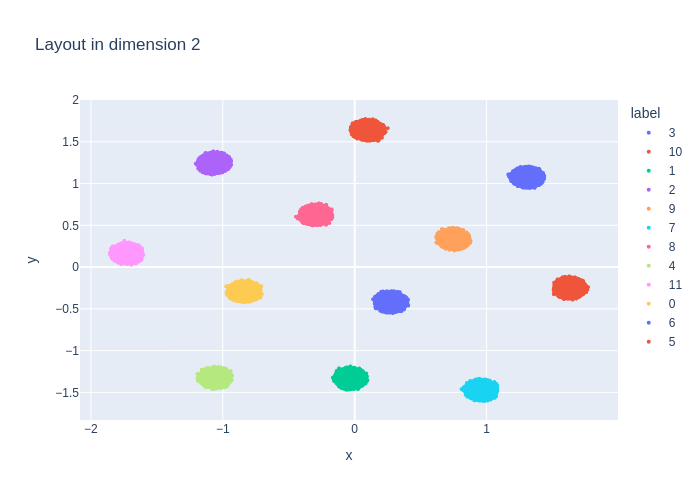

Computing persistence up to dimension 1 and global metrics
done


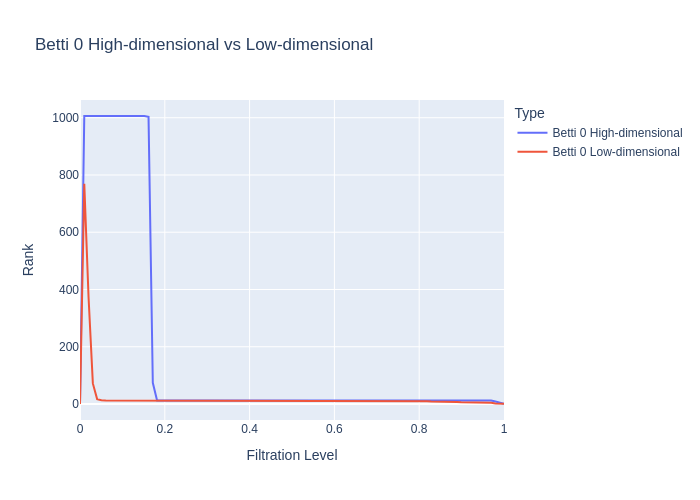

Distance `DTW` for dimension 0: 1.7110033710883756
Distance `TWED` for dimension 0: 0.11651545092223925
Distance `EMD` for dimension 0: 0.021888851246270682
Distance `Wasserstein` for dimension 0: 3.2052814454022096
Distance `bottleneck` for dimension 0: 126.6282958984375


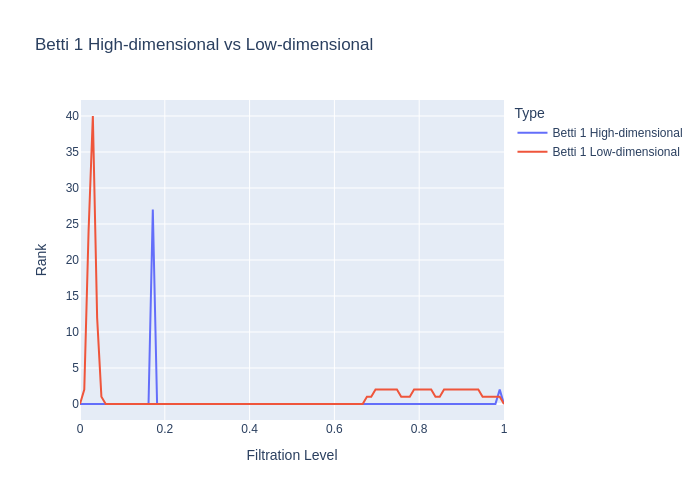

Distance `DTW` for dimension 1: 1.288205005434219
Distance `TWED` for dimension 1: 0.014966662673704877
Distance `EMD` for dimension 1: 0.026344242655525225
Distance `Wasserstein` for dimension 1: 0.02132665767421032
Distance `bottleneck` for dimension 1: 0.9532089233398438
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.804774063419237
Neighborhood preservation score (mean, std): [0.001771267270669341, 0.010589919053018093]
Computing context measures
done
Context preservation score (SVM): [1.0, 1.0, 0.0]
Context preservation score (kNN): [1.0, 1.0, 0.0]


In [10]:
viz_benchmark(reducer_blobs,
              features_blobs,
              labels=labels_blobs,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=4)

### Defining benchmark dictionary

In [11]:
benchmarks_blobs = {}

In [12]:
benchmark = run_benchmark(reducer_blobs,
                          features_blobs,
                          labels=labels_blobs,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_blobs['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 32/32 [00:02<00:00, 12.42it/s]


### CuML tSNE reducer

[W] [17:05:40.139227] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
Embedding time: 10.6902 seconds


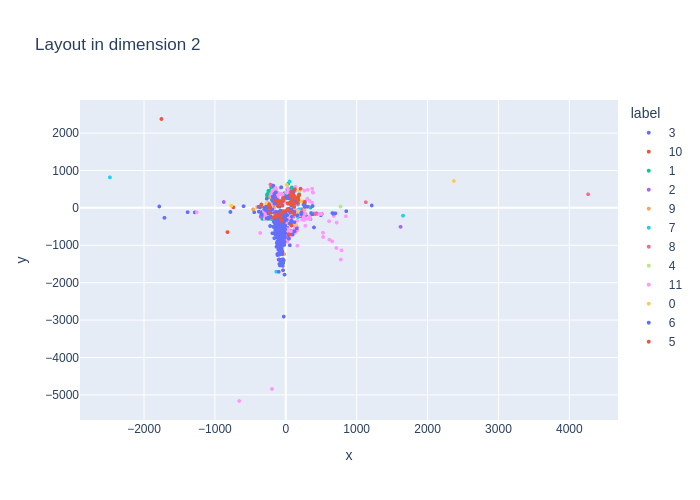

Computing persistence up to dimension 1 and global metrics
done


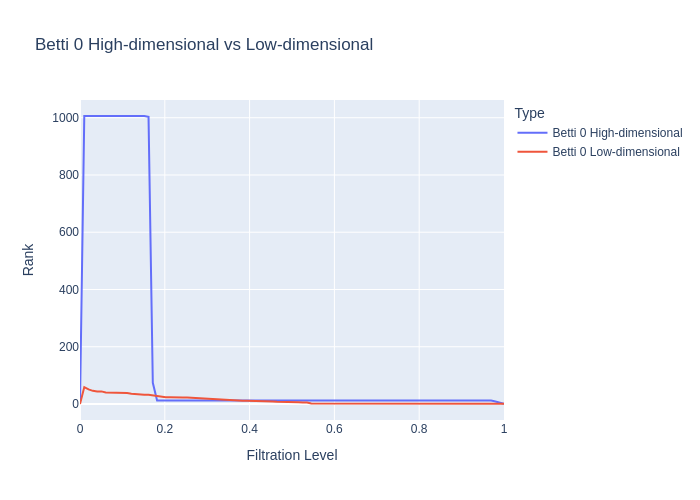

Distance `DTW` for dimension 0: 1.651720093032495
Distance `TWED` for dimension 0: 0.21818039578256881
Distance `EMD` for dimension 0: 0.027246098031950165
Distance `Wasserstein` for dimension 0: 3.1195324363282
Distance `bottleneck` for dimension 0: 126.06436157226562


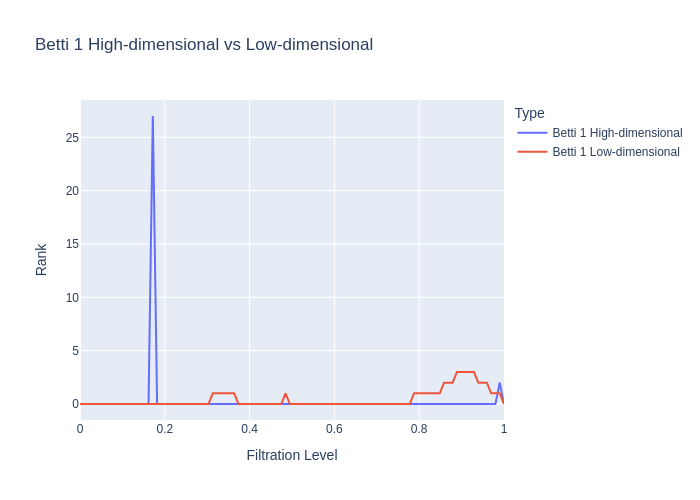

Distance `DTW` for dimension 1: 0.2575767805627875
Distance `TWED` for dimension 1: 0.011851203403288912
Distance `EMD` for dimension 1: 0.011404560199111298
Distance `Wasserstein` for dimension 1: 0.026001134347136426
Distance `bottleneck` for dimension 1: 16.081504821777344
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 4.454832038550329
Neighborhood preservation score (mean, std): [0.00039200103492476046, 0.0036997550632804632]
Computing context measures
done
Context preservation score (SVM): [1.0, 0.4614869390488948, -0.7733015265255319]
Context preservation score (kNN): [1.0, 0.8743666666666666, -0.13425546422491555]


In [13]:
tred_blobs = cTSNE(n_components=2,
                   method='fft',
                   perplexity=reducer_blobs.n_neighbors,
                   n_neighbors=3*reducer_blobs.n_neighbors+1)
#
viz_benchmark(tred_blobs,
              features_blobs,
              labels=labels_blobs,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=4)

In [14]:
benchmark = run_benchmark(tred_blobs,
                          features_blobs,
                          labels=labels_blobs,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_blobs['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

[W] [17:08:25.787652] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


### CuML UMAP reducer

Embedding time: 7.9065 seconds


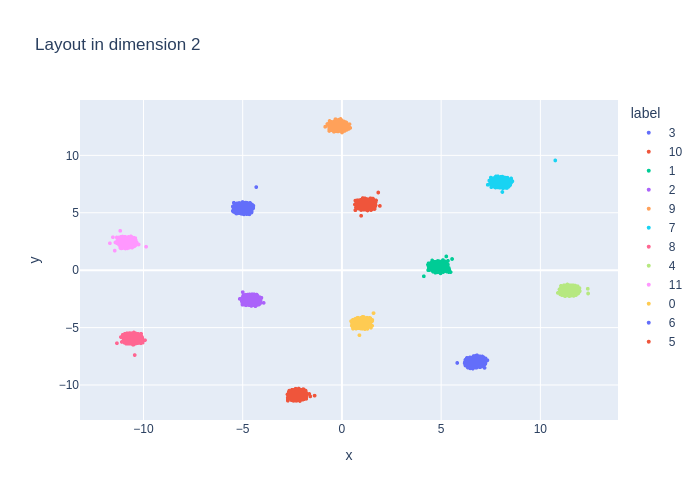

Computing persistence up to dimension 1 and global metrics
done


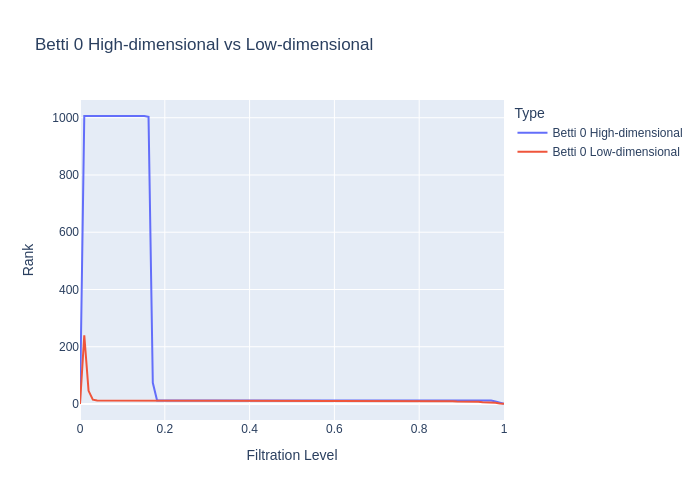

Distance `DTW` for dimension 0: 2.507734308659207
Distance `TWED` for dimension 0: 0.16679807951212697
Distance `EMD` for dimension 0: 0.03304416853310537
Distance `Wasserstein` for dimension 0: 3.211497913547751
Distance `bottleneck` for dimension 0: 126.6282958984375


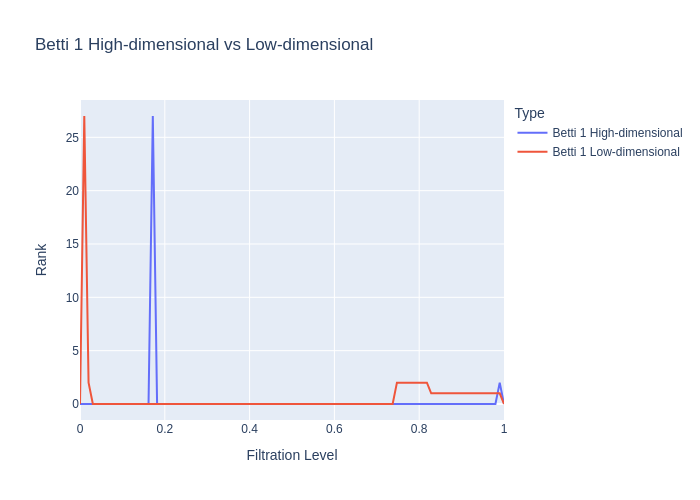

Distance `DTW` for dimension 1: 1.2226717923593016
Distance `TWED` for dimension 1: 0.0074740744097056494
Distance `EMD` for dimension 1: 0.011628735232962898
Distance `Wasserstein` for dimension 1: 0.021595471531381517
Distance `bottleneck` for dimension 1: 1.212120771408081
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.15621496900635
Neighborhood preservation score (mean, std): [0.0005831077578477561, 0.006076755467802286]
Computing context measures
done
Context preservation score (SVM): [1.0, 1.0, 0.0]
Context preservation score (kNN): [1.0, 1.0, 0.0]


In [15]:
cured_blobs = cUMAP(n_components=reducer_blobs.dimension,
                    n_neighbors=reducer_blobs.n_neighbors,
                    min_dist=reducer_blobs.min_dist,
                    spread=reducer_blobs.spread)
#
viz_benchmark(cured_blobs,
              features_blobs,
              labels=labels_blobs,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=4)

In [16]:
benchmark = run_benchmark(cured_blobs,
                          features_blobs,
                          labels=labels_blobs,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_blobs['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 80.9731 seconds


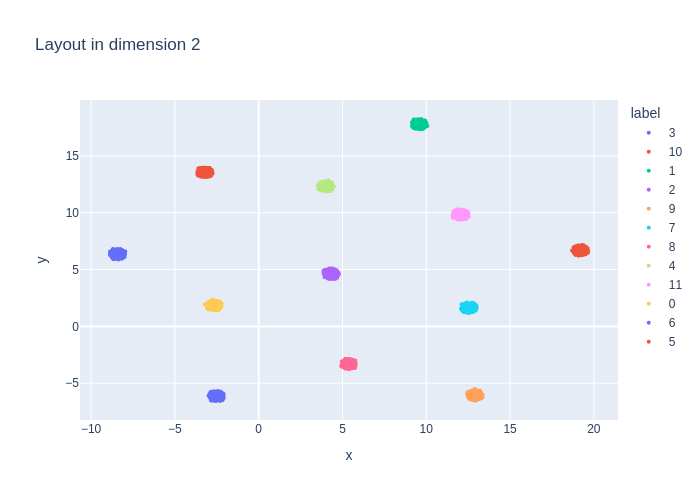

Computing persistence up to dimension 1 and global metrics
done


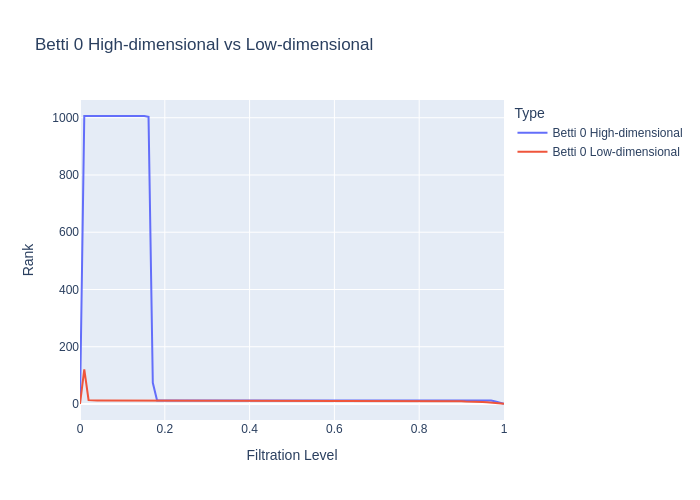

Distance `DTW` for dimension 0: 2.7144924986342827
Distance `TWED` for dimension 0: 0.19451072668339278
Distance `EMD` for dimension 0: 0.035729619461489504
Distance `Wasserstein` for dimension 0: 3.2119511891463826
Distance `bottleneck` for dimension 0: 126.6282958984375


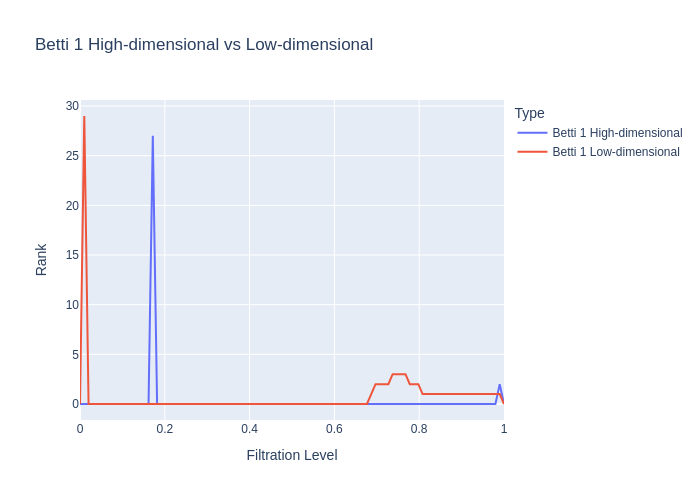

Distance `DTW` for dimension 1: 1.1945772411188105
Distance `TWED` for dimension 1: 0.008656228853575287
Distance `EMD` for dimension 1: 0.013755544746289417
Distance `Wasserstein` for dimension 1: 0.021757642984354914
Distance `bottleneck` for dimension 1: 1.4660749435424805
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.5711295072875493
Neighborhood preservation score (mean, std): [0.0005556565592996776, 0.005890439730137587]
Computing context measures
done
Context preservation score (SVM): [1.0, 1.0, 0.0]
Context preservation score (kNN): [1.0, 1.0, 0.0]


In [17]:
red_blobs = UMAP(n_components=reducer_blobs.dimension,
                 n_neighbors=reducer_blobs.n_neighbors,
                 min_dist=reducer_blobs.min_dist,
                 spread=reducer_blobs.spread)
#
viz_benchmark(red_blobs,
              features_blobs,
              labels=labels_blobs,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=4)

In [18]:
benchmark = run_benchmark(red_blobs,
                          features_blobs,
                          labels=labels_blobs,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_blobs['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Defining benchmark visualization procedure

In [19]:
import matplotlib.pyplot as plt

def plot_algorithm_comparison(data):
    """
    Plots comparison graphs for different algorithms based on their performance metrics.

    Parameters:
        data (dict): A dictionary where keys are algorithm names and values are dictionaries of metrics and distance metrics.
    """

    algorithms = list(data.keys())

    # Extracting data from the input dictionary
    embedding_time = [data[alg]['Embedding time'] for alg in algorithms]
    embedding_stress = [data[alg]['Embedding stress'] for alg in algorithms]
    neighborhood_preservation = [data[alg]['Neighborhood preservation score'] for alg in algorithms]
    context_preservation_svm = [data[alg]['Context preservation score (SVM)'] for alg in algorithms]
    context_preservation_knn = [data[alg]['Context preservation score (kNN)'] for alg in algorithms]

    # Distance metrics for dimension 0 and dimension 1
    dtw_dim0 = [data[alg]['Distance DTW for dimension 0'] for alg in algorithms]
    twed_dim0 = [data[alg]['Distance TWED for dimension 0'] for alg in algorithms]
    emd_dim0 = [data[alg]['Distance EMD for dimension 0'] for alg in algorithms]
    wasserstein_dim0 = [data[alg]['Distance Wasserstein for dimension 0'] for alg in algorithms]
    bottleneck_dim0 = [data[alg]['Distance bottleneck for dimension 0'] for alg in algorithms]

    dtw_dim1 = [data[alg]['Distance DTW for dimension 1'] for alg in algorithms]
    twed_dim1 = [data[alg]['Distance TWED for dimension 1'] for alg in algorithms]
    emd_dim1 = [data[alg]['Distance EMD for dimension 1'] for alg in algorithms]
    wasserstein_dim1 = [data[alg]['Distance Wasserstein for dimension 1'] for alg in algorithms]
    bottleneck_dim1 = [data[alg]['Distance bottleneck for dimension 1'] for alg in algorithms]

    # Normalize and take log for the distance metrics relative to the first algorithm (assumed as reference)
    dtw_dim0_norm = np.log(np.array(dtw_dim0) / dtw_dim0[0])
    twed_dim0_norm = np.log(np.array(twed_dim0) / twed_dim0[0])
    emd_dim0_norm = np.log(np.array(emd_dim0) / emd_dim0[0])
    wasserstein_dim0_norm = np.log(np.array(wasserstein_dim0) / wasserstein_dim0[0])
    bottleneck_dim0_norm = np.log(np.array(bottleneck_dim0) / bottleneck_dim0[0])

    dtw_dim1_norm = np.log(np.array(dtw_dim1) / dtw_dim1[0])
    twed_dim1_norm = np.log(np.array(twed_dim1) / twed_dim1[0])
    emd_dim1_norm = np.log(np.array(emd_dim1) / emd_dim1[0])
    wasserstein_dim1_norm = np.log(np.array(wasserstein_dim1) / wasserstein_dim1[0])
    bottleneck_dim1_norm = np.log(np.array(bottleneck_dim1) / bottleneck_dim1[0])

    # Plotting the graphs
    fig, axs = plt.subplots(3, 2, figsize=(15, 15))

    # Embedding Time
    axs[0, 0].bar(algorithms, embedding_time, color='blue')
    axs[0, 0].set_title('Embedding Time (seconds)')
    axs[0, 0].set_ylabel('Time (s)')

    # Embedding Stress
    axs[0, 1].bar(algorithms, embedding_stress, color='green')
    axs[0, 1].set_title('Embedding Stress (Scaling Adjusted)')
    axs[0, 1].set_ylabel('Stress')

    # Neighborhood Preservation Score (Mean)
    axs[1, 0].bar(algorithms, neighborhood_preservation, color='orange')
    axs[1, 0].set_title('Neighborhood Preservation Score (Mean)')
    axs[1, 0].set_ylabel('Score')

    # Context Preservation Score (SVM and kNN)
    bar_width = 0.35
    index = np.arange(len(algorithms))

    axs[1, 1].bar(index, context_preservation_svm, bar_width, label='SVM', color='red')
    axs[1, 1].bar(index + bar_width, context_preservation_knn, bar_width, label='kNN', color='purple')
    axs[1, 1].set_title('Context Preservation Score (SVM and kNN)')
    axs[1, 1].set_ylabel('Score')
    axs[1, 1].set_xticks(index + bar_width / 2)
    axs[1, 1].set_xticklabels(algorithms)
    axs[1, 1].legend()

    # Plotting the normalized and log-transformed distance metrics for dimension 0
    axs[2, 0].plot(algorithms, dtw_dim0_norm, marker='o', label='DTW', color='blue')
    axs[2, 0].plot(algorithms, twed_dim0_norm, marker='o', label='TWED', color='green')
    axs[2, 0].plot(algorithms, emd_dim0_norm, marker='o', label='EMD', color='orange')
    axs[2, 0].plot(algorithms, wasserstein_dim0_norm, marker='o', label='Wasserstein', color='red')
    axs[2, 0].plot(algorithms, bottleneck_dim0_norm, marker='o', label='Bottleneck', color='purple')
    axs[2, 0].set_title('Normalized & Log-Transformed Distance Metrics for Dimension 0')
    axs[2, 0].set_ylabel('Log(Distance Ratio)')
    axs[2, 0].legend()

    # Plotting the normalized and log-transformed distance metrics for dimension 1
    axs[2, 1].plot(algorithms, dtw_dim1_norm, marker='o', label='DTW', color='blue')
    axs[2, 1].plot(algorithms, twed_dim1_norm, marker='o', label='TWED', color='green')
    axs[2, 1].plot(algorithms, emd_dim1_norm, marker='o', label='EMD', color='orange')
    axs[2, 1].plot(algorithms, wasserstein_dim1_norm, marker='o', label='Wasserstein', color='red')
    axs[2, 1].plot(algorithms, bottleneck_dim1_norm, marker='o', label='Bottleneck', color='purple')
    axs[2, 1].set_title('Normalized & Log-Transformed Distance Metrics for Dimension 1')
    axs[2, 1].set_ylabel('Log(Distance Ratio)')
    axs[2, 1].legend()

    plt.tight_layout()
    plt.show()

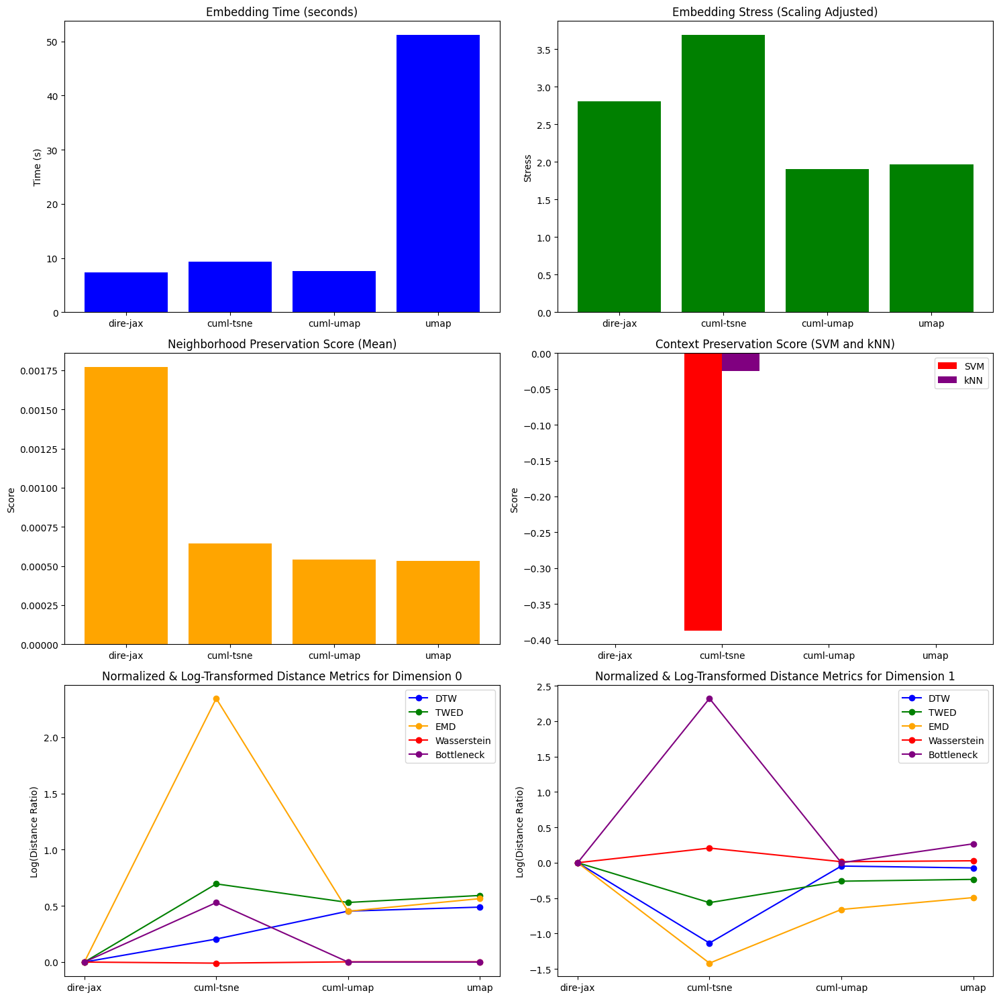

In [20]:
#
# Plot the benchmarking results
#
plot_algorithm_comparison(benchmarks_blobs)

## Dataset "MNIST Digits"

In [21]:
from sklearn.datasets import fetch_openml
# Loading the full MNIST dataset
mnist = fetch_openml('mnist_784', version=1, parser='auto')
#
features_mnist = np.array(mnist['data'], dtype=np.float32)
labels_mnist = np.array(mnist['target'], dtype=np.int32)
#
features_mnist = features_mnist / 255.0 - 0.5

### DiRe reducer

In [22]:
reducer_mnist = DiRe(dimension=2,
                     n_neighbors=32,
                     init_embedding_type='spectral',
                     max_iter_layout=128,
                     min_dist=1e-4,
                     spread=1.0,
                     cutoff=8.0,
                     n_sample_dirs=4,
                     sample_size=32,
                     neg_ratio=16,
                     verbose=False,)

100%|██████████| 128/128 [00:10<00:00, 12.60it/s]


Embedding time: 21.5671 seconds


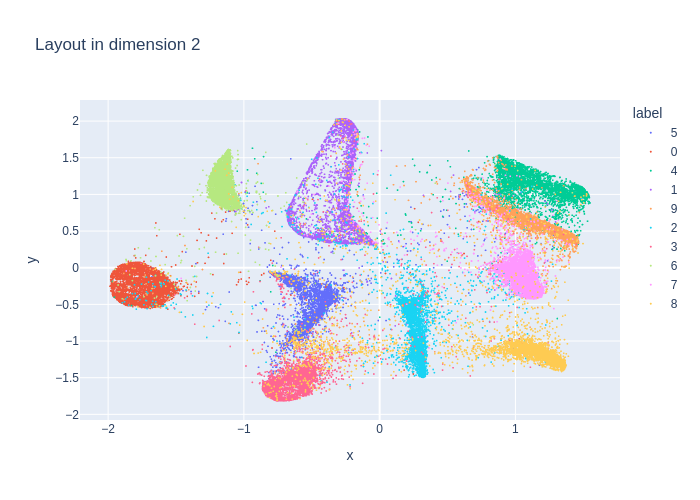

Computing persistence up to dimension 1 and global metrics
done


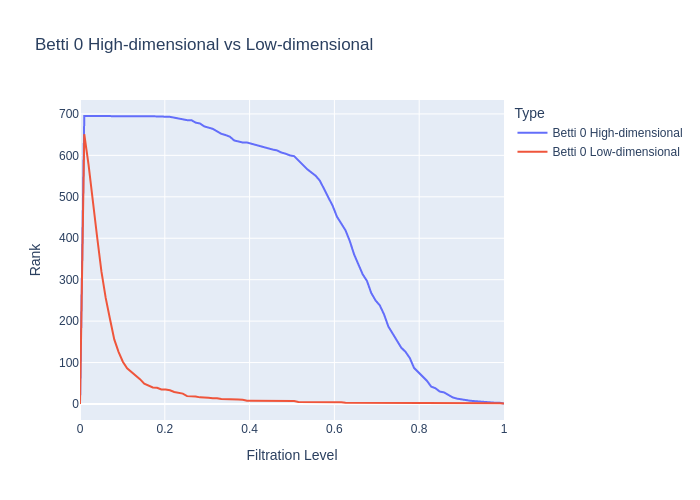

Distance `DTW` for dimension 0: 0.3997615868388619
Distance `TWED` for dimension 0: 0.14175555744230126
Distance `EMD` for dimension 0: 0.004287759630915444
Distance `Wasserstein` for dimension 0: 0.4077070357133928
Distance `bottleneck` for dimension 0: 4.603883266448975


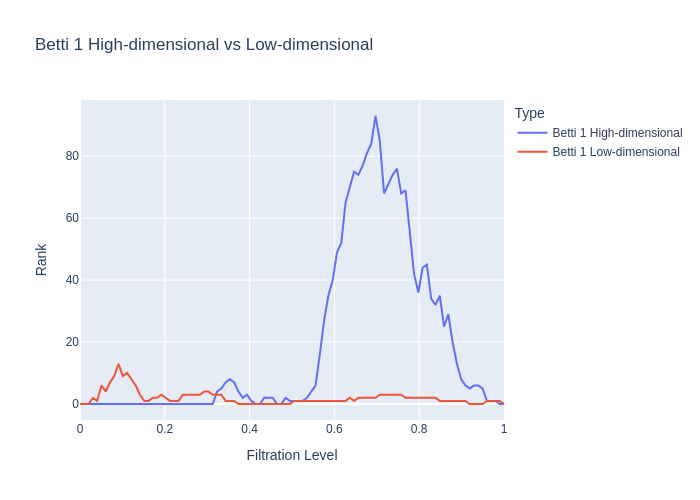

Distance `DTW` for dimension 1: 0.29213506391554317
Distance `TWED` for dimension 1: 0.059076544606420874
Distance `EMD` for dimension 1: 0.009170685051564539
Distance `Wasserstein` for dimension 1: 0.01941946340038222
Distance `bottleneck` for dimension 1: 0.6226644515991211
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 3.895154097117408
Neighborhood preservation score (mean, std): [0.029235413298010826, 0.04114306718111038]
Computing context measures
done
Context preservation score (SVM): [0.8477751756440282, 0.8435597189695551, -0.004984779083915329]
Context preservation score (kNN): [0.923, 0.9423333333333334, 0.020729834522628554]


In [23]:
viz_benchmark(reducer_mnist,
              features_mnist,
              labels=labels_mnist,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [24]:
benchmarks_mnist = {}

In [25]:
benchmark = run_benchmark(reducer_mnist,
                          features_mnist,
                          labels=labels_mnist,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_mnist['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 128/128 [00:06<00:00, 18.94it/s]


### CuML tSNE reducer

[W] [17:25:38.231111] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
Embedding time: 3.8823 seconds


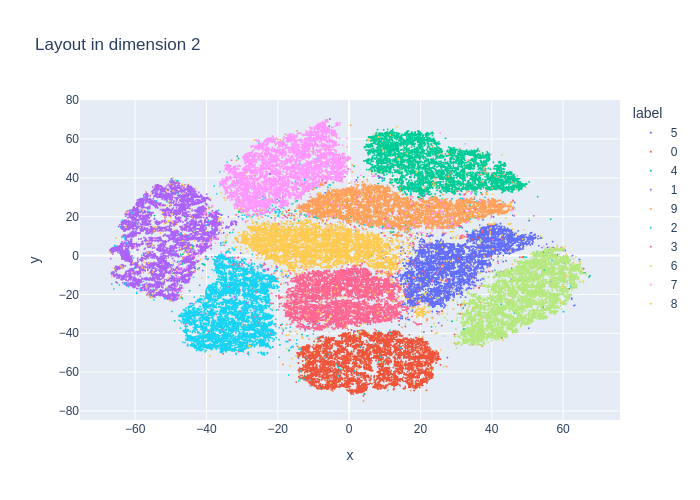

Computing persistence up to dimension 1 and global metrics
done


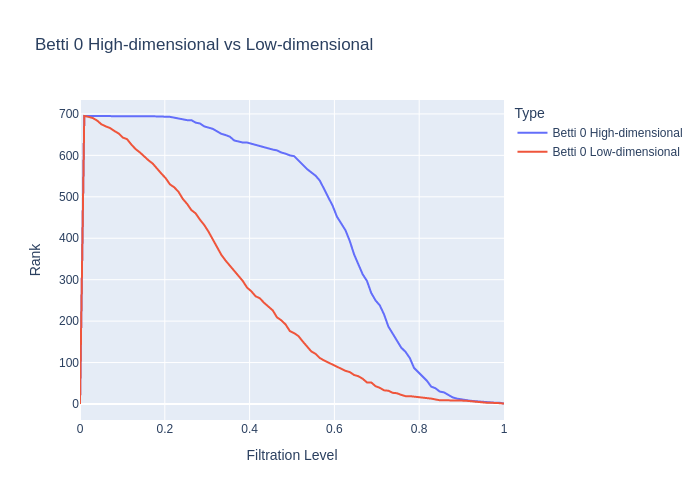

Distance `DTW` for dimension 0: 0.0764917875604522
Distance `TWED` for dimension 0: 0.0914210206107675
Distance `EMD` for dimension 0: 0.00034869975459629436
Distance `Wasserstein` for dimension 0: 0.30376383167307053
Distance `bottleneck` for dimension 0: 3.321775197982788


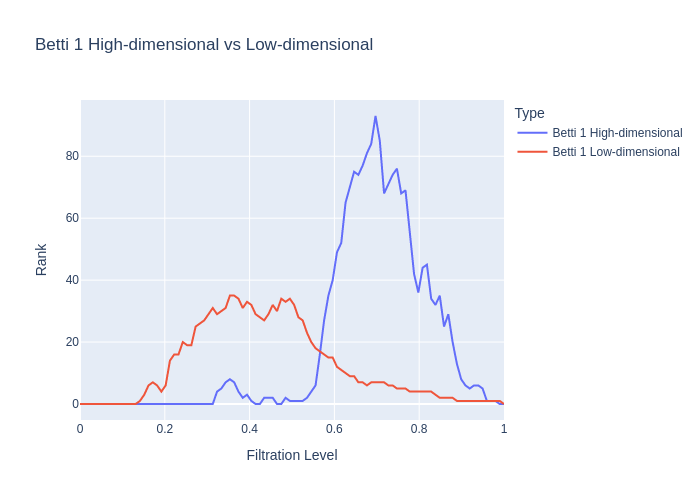

Distance `DTW` for dimension 1: 0.14829388609000338
Distance `TWED` for dimension 1: 0.055683233579089206
Distance `EMD` for dimension 1: 0.0003143579036431334
Distance `Wasserstein` for dimension 1: 0.030457729914336575
Distance `bottleneck` for dimension 1: 3.944486141204834
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 3.518587029919824
Neighborhood preservation score (mean, std): [0.06483776122331619, 0.06662996113300323]
Computing context measures
done
Context preservation score (SVM): [0.8477751756440282, 0.834192037470726, -0.01615184097020984]
Context preservation score (kNN): [0.9241904761904762, 0.9616190476190476, 0.039700178380434936]


In [26]:
tred_mnist = cTSNE(n_components=2,
                   method='fft',
                   perplexity=25,
                   n_neighbors=3*25+1)
#
viz_benchmark(tred_mnist,
              features_mnist,
              labels=labels_mnist,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [27]:
benchmark = run_benchmark(tred_mnist,
                          features_mnist,
                          labels=labels_mnist,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_mnist['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

[W] [17:27:01.276637] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


### CuML UMAP reducer

Embedding time: 2.7467 seconds


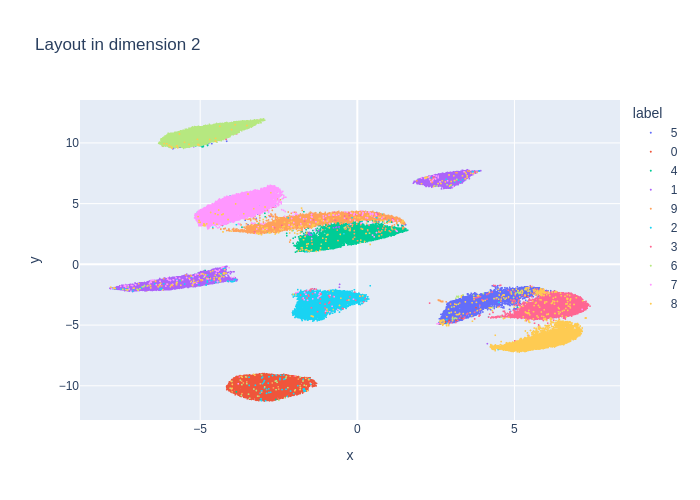

Computing persistence up to dimension 1 and global metrics
done


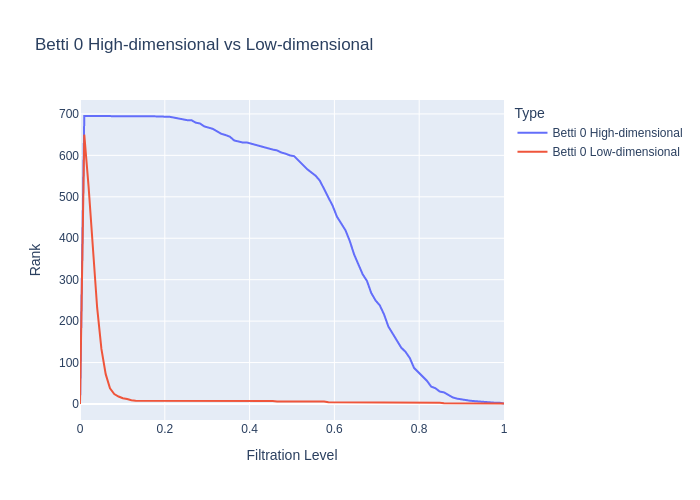

Distance `DTW` for dimension 0: 0.4633428169284901
Distance `TWED` for dimension 0: 0.17237398857007308
Distance `EMD` for dimension 0: 0.006387392470175997
Distance `Wasserstein` for dimension 0: 0.4139206930323861
Distance `bottleneck` for dimension 0: 4.57657527923584


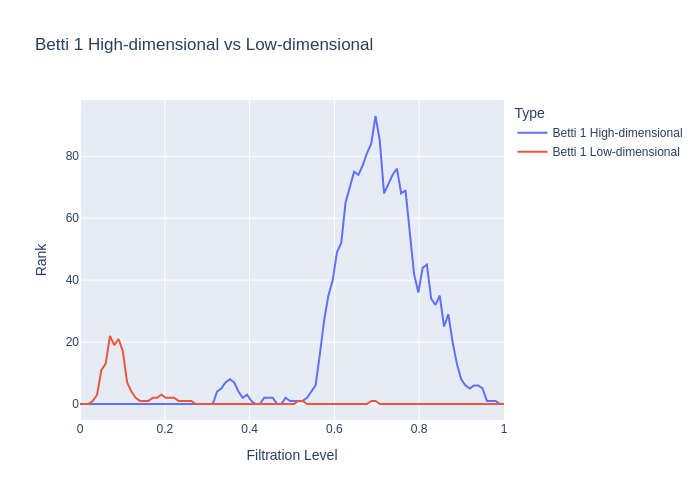

Distance `DTW` for dimension 1: 0.2870970306895842
Distance `TWED` for dimension 1: 0.06073264871918488
Distance `EMD` for dimension 1: 0.012189843717388
Distance `Wasserstein` for dimension 1: 0.019962151085658048
Distance `bottleneck` for dimension 1: 0.6226644515991211
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.301280072530847
Neighborhood preservation score (mean, std): [0.024433955550193787, 0.036480534821748734]
Computing context measures
done
Context preservation score (SVM): [0.8477751756440282, 0.673536299765808, -0.2300735859788795]
Context preservation score (kNN): [0.923, 0.9643333333333334, 0.04380778180517324]


In [28]:
cured_mnist = cUMAP(n_components=reducer_mnist.dimension,
                    n_neighbors=reducer_mnist.n_neighbors,
                    min_dist=reducer_mnist.min_dist,
                    spread=reducer_mnist.spread)
#
viz_benchmark(cured_mnist,
              features_mnist,
              labels=labels_mnist,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [29]:
benchmark = run_benchmark(cured_mnist,
                          features_mnist,
                          labels=labels_mnist,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_mnist['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 56.1773 seconds


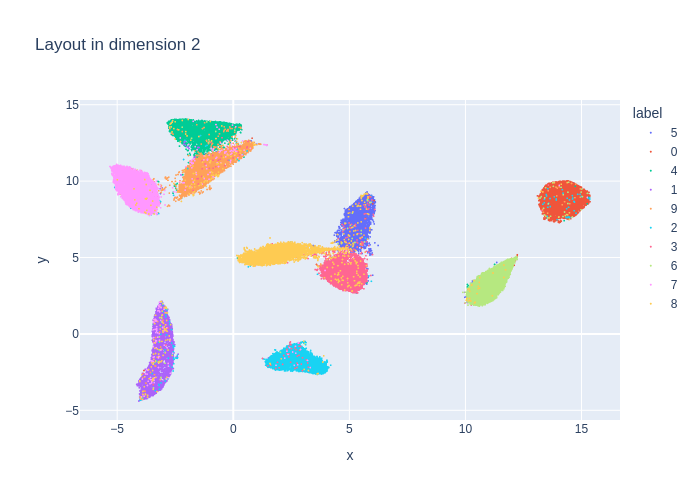

Computing persistence up to dimension 1 and global metrics
done


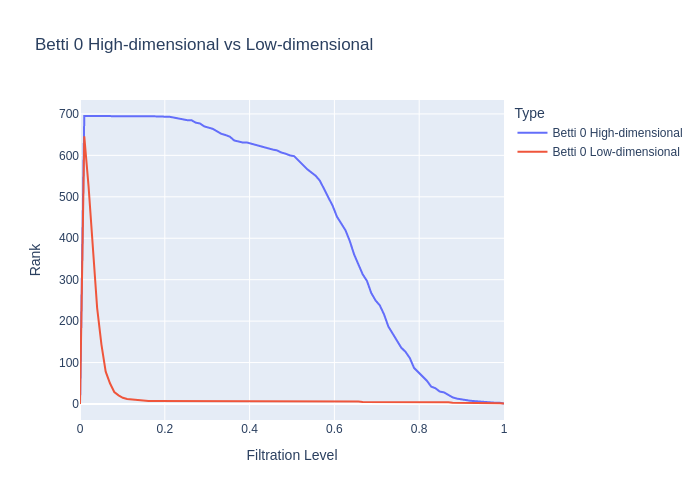

Distance `DTW` for dimension 0: 0.47083955934157096
Distance `TWED` for dimension 0: 0.17125083530823904
Distance `EMD` for dimension 0: 0.006027245265277588
Distance `Wasserstein` for dimension 0: 0.41377723402472705
Distance `bottleneck` for dimension 0: 4.57657527923584


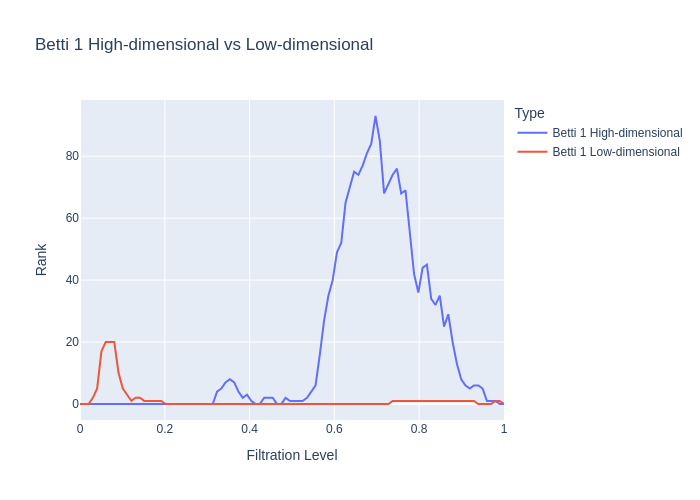

Distance `DTW` for dimension 1: 0.2757789673101536
Distance `TWED` for dimension 1: 0.05736219799180094
Distance `EMD` for dimension 1: 0.01182868168794703
Distance `Wasserstein` for dimension 1: 0.019966134992720777
Distance `bottleneck` for dimension 1: 0.6226644515991211
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.4196778670079753
Neighborhood preservation score (mean, std): [0.025326402857899666, 0.03656892850995064]
Computing context measures
done
Context preservation score (SVM): [0.8477751756440282, 0.8285714285714286, -0.022912430100086107]
Context preservation score (kNN): [0.923, 0.9664285714285714, 0.04597815704672282]


In [30]:
red_mnist = UMAP(n_components=reducer_mnist.dimension,
                 n_neighbors=reducer_mnist.n_neighbors,
                 min_dist=reducer_mnist.min_dist,
                 spread=reducer_mnist.spread)
#
viz_benchmark(red_mnist,
              features_mnist,
              labels=labels_mnist,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [31]:
benchmark = run_benchmark(red_mnist,
                          features_mnist,
                          labels=labels_mnist,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_mnist['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

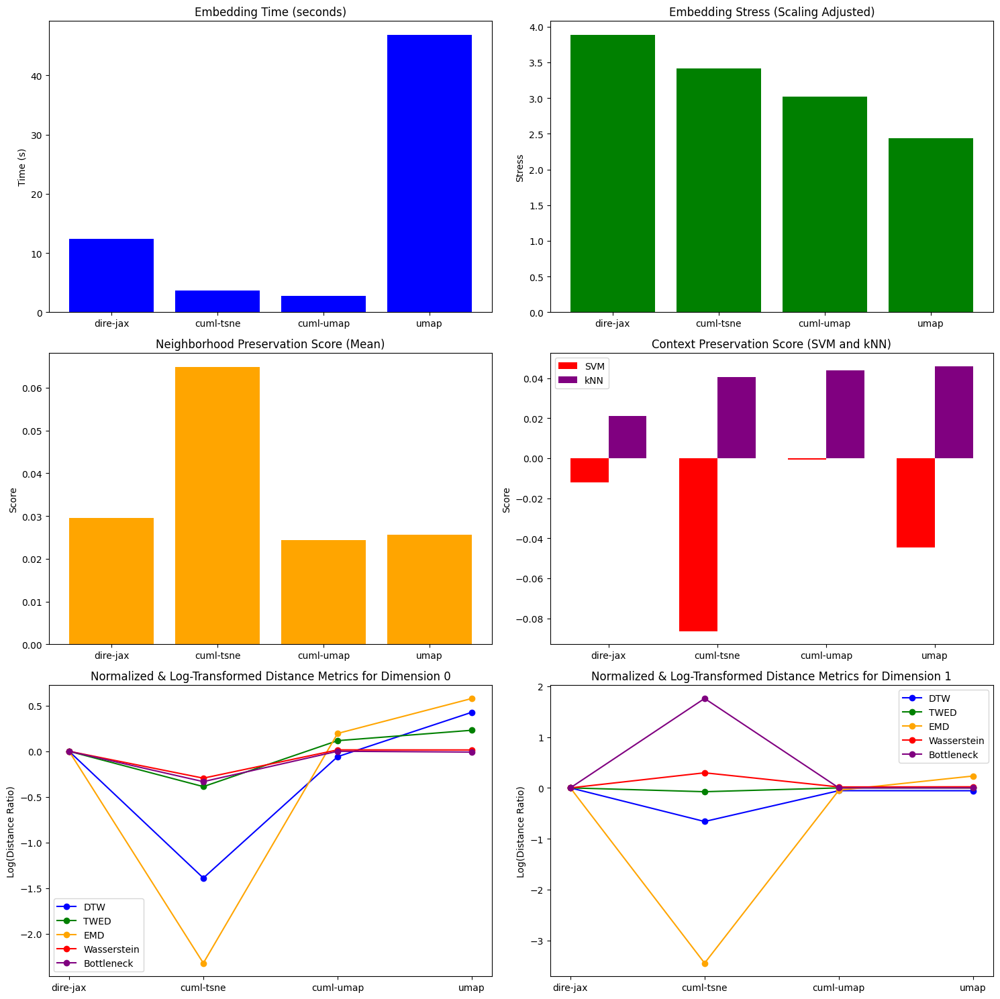

In [32]:
plot_algorithm_comparison(benchmarks_mnist)

## Dataset "Forest Cover Types"

In [33]:
from sklearn.datasets import fetch_covtype
#
features_covtype, labels_covtype = fetch_covtype(return_X_y=True)
features_covtype, labels_covtype = features_covtype[::5], labels_covtype[::5]

### DiRe reducer

In [34]:
reducer_covtype  = DiRe(dimension=3,
                        n_neighbors=32,
                        init_embedding_type='pca',
                        max_iter_layout=64,
                        min_dist=1e-1,
                        spread=1.0,
                        cutoff=16.0,
                        n_sample_dirs=8,
                        sample_size=8,
                        neg_ratio=8,
                        verbose=False)

100%|██████████| 64/64 [00:06<00:00, 10.45it/s]


Embedding time: 7.9306 seconds


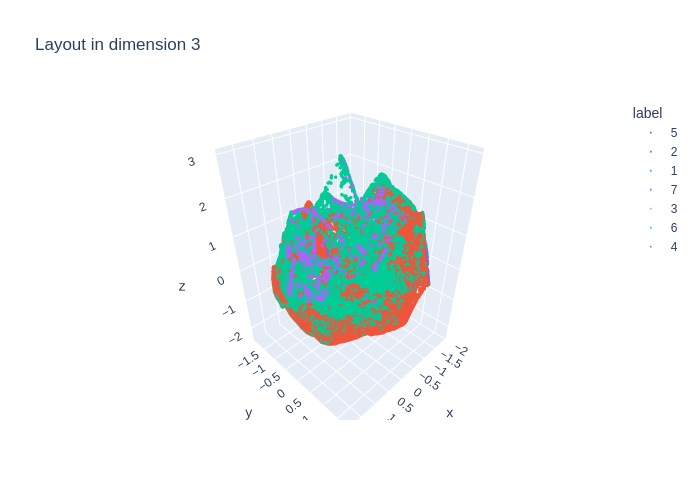

Computing persistence up to dimension 1 and global metrics
done


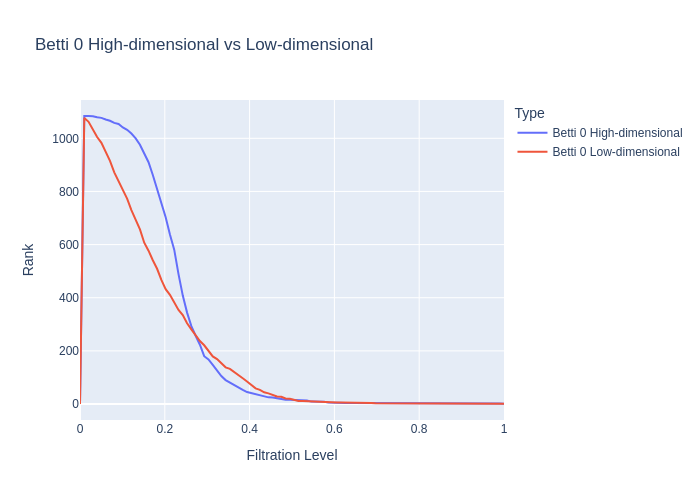

Distance `DTW` for dimension 0: 5.111000147087716
Distance `TWED` for dimension 0: 0.09294223480501491
Distance `EMD` for dimension 0: 0.016465439222390955
Distance `Wasserstein` for dimension 0: 17.716207535246994
Distance `bottleneck` for dimension 0: 573.5660400390625


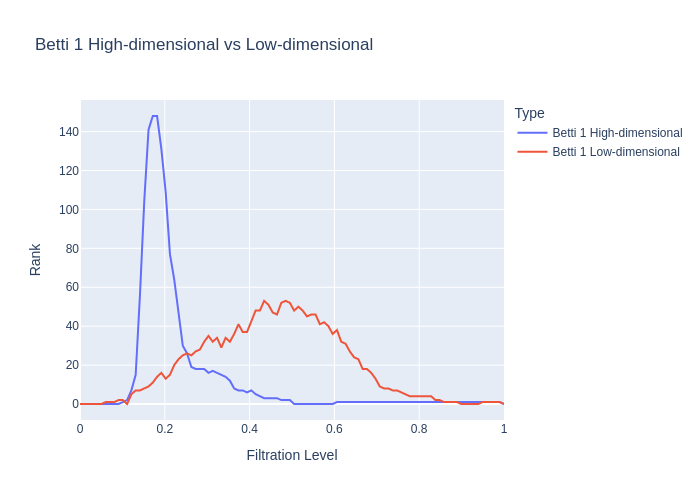

Distance `DTW` for dimension 1: 8.956262167145143
Distance `TWED` for dimension 1: 0.048561781142665045
Distance `EMD` for dimension 1: 0.05703091033505726
Distance `Wasserstein` for dimension 1: 1.7558335058243806
Distance `bottleneck` for dimension 1: 416.88323974609375
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 1.4015786780021664
Neighborhood preservation score (mean, std): [0.05100785568356514, 0.07770650833845139]
Computing context measures
done
Context preservation score (SVM): [0.7180299539170507, 0.5803571428571429, -0.21286760914277444]
Context preservation score (kNN): [0.8037922033217636, 0.7296692579099854, -0.09674942207577424]


In [35]:
viz_benchmark(reducer_covtype,
              features_covtype,
              labels=labels_covtype,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [36]:
benchmarks_covtype = {}

In [37]:
benchmark = run_benchmark(reducer_covtype,
                          features_covtype,
                          labels=labels_covtype,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_covtype['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 64/64 [00:02<00:00, 26.44it/s]


### CuML tSNE reducer

[W] [17:40:32.566217] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
Embedding time: 2.3836 seconds


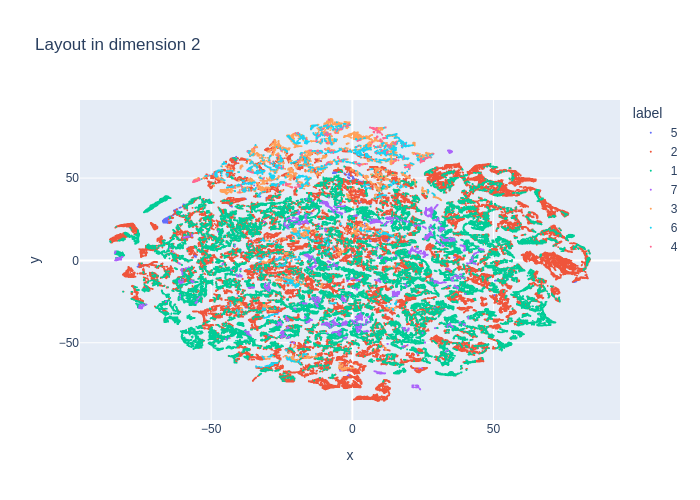

Computing persistence up to dimension 1 and global metrics
done


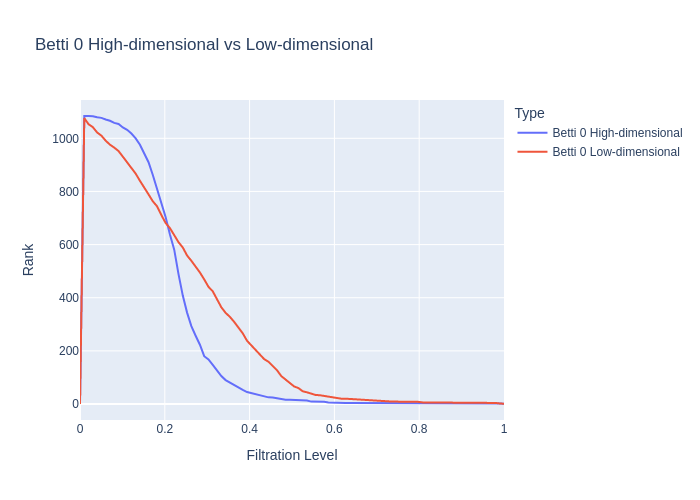

Distance `DTW` for dimension 0: 5.089260820674561
Distance `TWED` for dimension 0: 0.10547040601305302
Distance `EMD` for dimension 0: 0.015776820564818262
Distance `Wasserstein` for dimension 0: 17.88110521876909
Distance `bottleneck` for dimension 0: 573.5660400390625


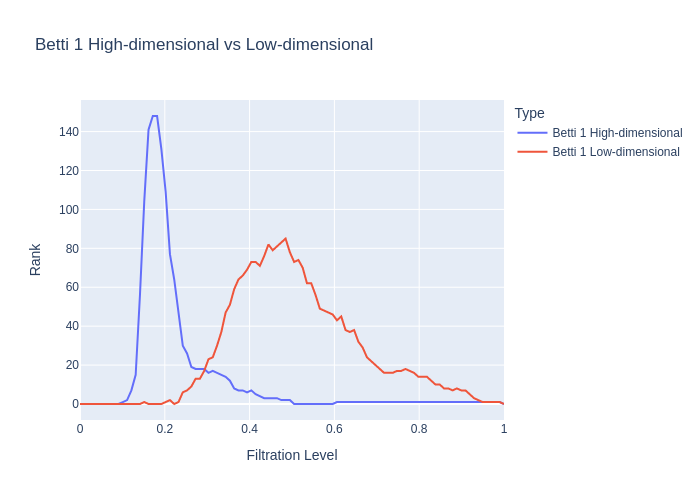

Distance `DTW` for dimension 1: 8.888135822404296
Distance `TWED` for dimension 1: 0.044378096217016445
Distance `EMD` for dimension 1: 0.07349859656507976
Distance `Wasserstein` for dimension 1: 1.777212923664963
Distance `bottleneck` for dimension 1: 416.88323974609375
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 3.036683447217354
Neighborhood preservation score (mean, std): [0.08909296989440918, 0.12161993235349655]
Computing context measures
done
Context preservation score (SVM): [0.7180299539170507, 0.4876152073732719, -0.3869847013904226]
Context preservation score (kNN): [0.8064312555577866, 0.7767706032529187, -0.03747358306942461]


In [38]:
tred_covtype = cTSNE(n_components=2,
                     method='fft',
                     perplexity=25,
                     n_neighbors=3*25+1)
#
viz_benchmark(tred_covtype,
              features_covtype,
              labels=labels_covtype,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [39]:
benchmark = run_benchmark(tred_covtype,
                          features_covtype,
                          labels=labels_covtype,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_covtype['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

[W] [17:42:46.070048] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


### CuML UMAP reducer

Embedding time: 1.2428 seconds


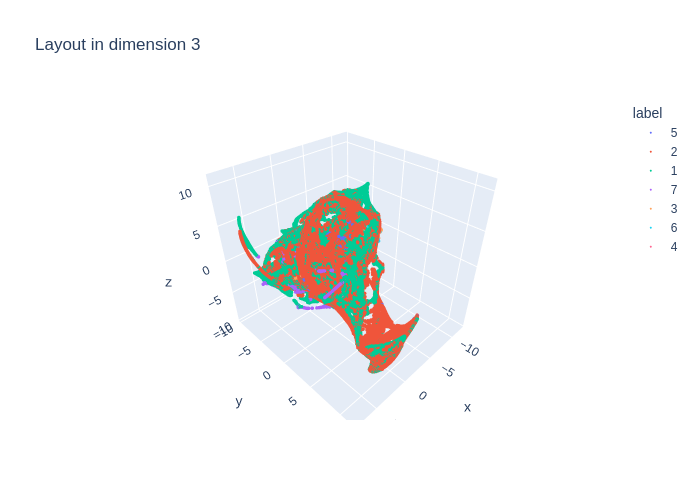

Computing persistence up to dimension 1 and global metrics
done


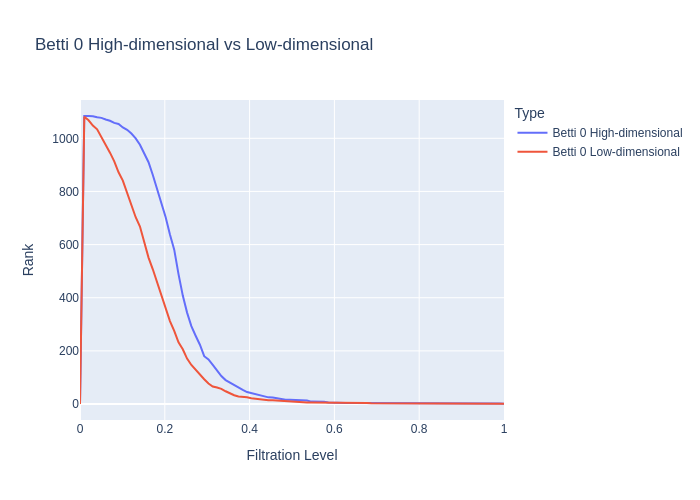

Distance `DTW` for dimension 0: 5.109487981542159
Distance `TWED` for dimension 0: 0.0767861239944942
Distance `EMD` for dimension 0: 0.01849242037219913
Distance `Wasserstein` for dimension 0: 17.74098652109512
Distance `bottleneck` for dimension 0: 573.5660400390625


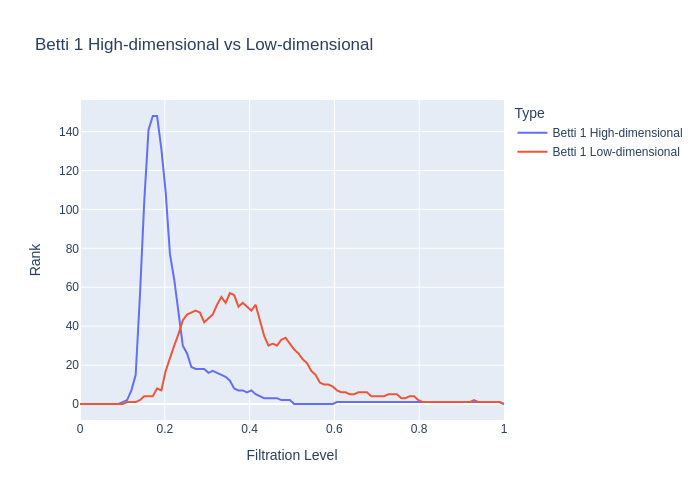

Distance `DTW` for dimension 1: 8.938709865974568
Distance `TWED` for dimension 1: 0.045360359832017416
Distance `EMD` for dimension 1: 0.046528138865989936
Distance `Wasserstein` for dimension 1: 1.7578943478402074
Distance `bottleneck` for dimension 1: 416.88323974609375
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 1.772481573353364
Neighborhood preservation score (mean, std): [0.053968485444784164, 0.08364689350128174]
Computing context measures
done
Context preservation score (SVM): [0.7180299539170507, 0.5495391705069125, -0.26743123151532605]
Context preservation score (kNN): [0.8037922033217636, 0.7397091305470296, -0.08308374009532585]


In [40]:
cured_covtype = cUMAP(n_components=reducer_covtype.dimension,
                      n_neighbors=reducer_covtype.n_neighbors,
                      min_dist=reducer_covtype.min_dist,
                      spread=reducer_covtype.spread)
#
viz_benchmark(cured_covtype,
              features_covtype,
              labels=labels_covtype,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [41]:
benchmark = run_benchmark(cured_covtype,
                          features_covtype,
                          labels=labels_covtype,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_covtype['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 77.1976 seconds


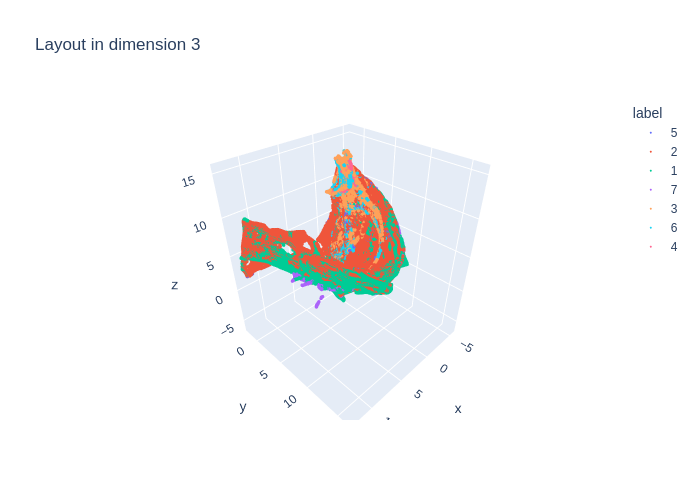

Computing persistence up to dimension 1 and global metrics
done


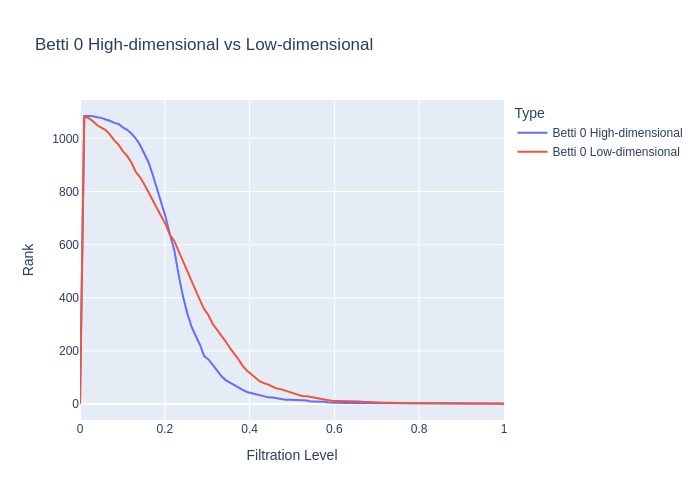

Distance `DTW` for dimension 0: 5.025075524051521
Distance `TWED` for dimension 0: 0.08544674527827432
Distance `EMD` for dimension 0: 0.01454330174598753
Distance `Wasserstein` for dimension 0: 17.740382113429007
Distance `bottleneck` for dimension 0: 573.5660400390625


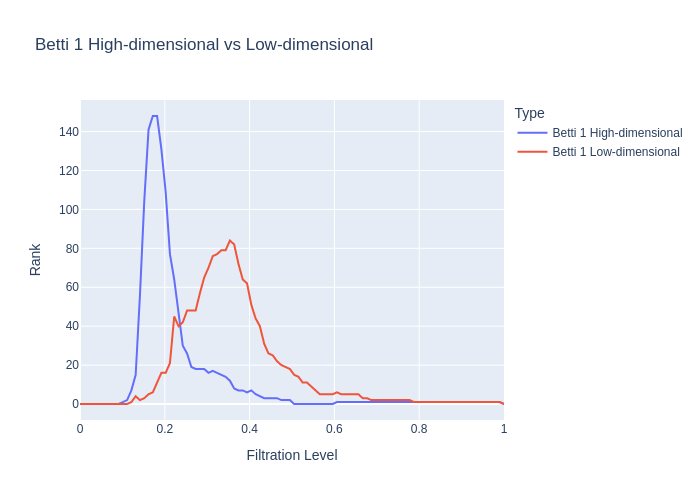

Distance `DTW` for dimension 1: 8.936677296118479
Distance `TWED` for dimension 1: 0.03976583089410698
Distance `EMD` for dimension 1: 0.04975309423551356
Distance `Wasserstein` for dimension 1: 1.7582826914753367
Distance `bottleneck` for dimension 1: 416.88323974609375
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.4350011235375604
Neighborhood preservation score (mean, std): [0.061923522502183914, 0.09099602699279785]
Computing context measures
done
Context preservation score (SVM): [0.7180299539170507, 0.5273617511520737, -0.3086245388490472]
Context preservation score (kNN): [0.8037922033217636, 0.7453888299245576, -0.07543478060534471]


In [42]:
red_covtype = UMAP(n_components=reducer_covtype.dimension,
                   n_neighbors=reducer_covtype.n_neighbors,
                   min_dist=reducer_covtype.min_dist,
                   spread=reducer_covtype.spread)
#
viz_benchmark(red_covtype,
              features_covtype,
              labels=labels_covtype,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [43]:
benchmark = run_benchmark(red_covtype,
                          features_covtype,
                          labels=labels_covtype,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_covtype['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

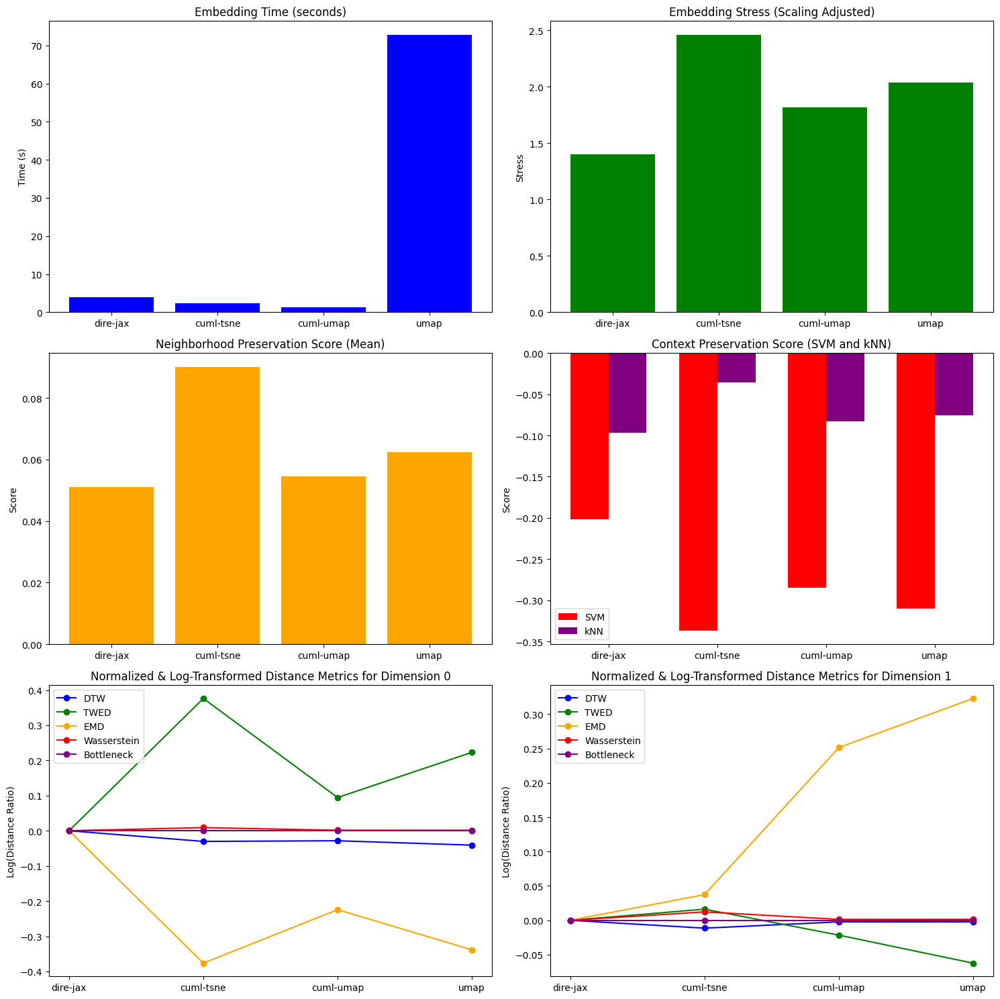

In [44]:
plot_algorithm_comparison(benchmarks_covtype)

## Dataset "Disk Uniform"

In [45]:
def rand_point_disk(n, num=1):
  prepts = np.random.randn(num, n)
  prenorms = np.linalg.norm(prepts, axis=1).reshape(-1, 1)
  rads = np.sqrt(np.random.rand(num)).reshape(-1, 1)
  pts = prepts * rads/prenorms
  return pts

In [46]:
features_disk, labels_disk = rand_point_disk(2, 10000), None

### DiRe reducer

In [47]:
reducer_disk = DiRe(dimension=2,
                    n_neighbors=64,
                    init_embedding_type='pca',
                    max_iter_layout=16,
                    min_dist=1e-4,
                    spread=1.0,
                    cutoff=1.0,
                    n_sample_dirs=8,
                    sample_size=32,
                    neg_ratio=8,
                    verbose=False,)

100%|██████████| 16/16 [00:03<00:00,  4.74it/s]


Embedding time: 4.2238 seconds


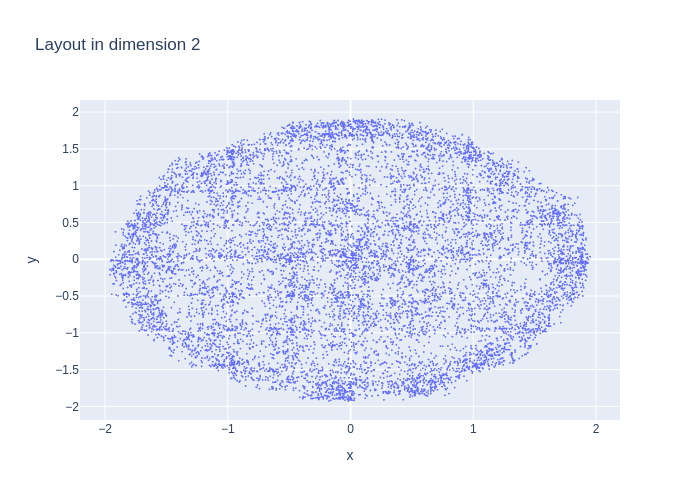

Computing persistence up to dimension 1 and global metrics
done


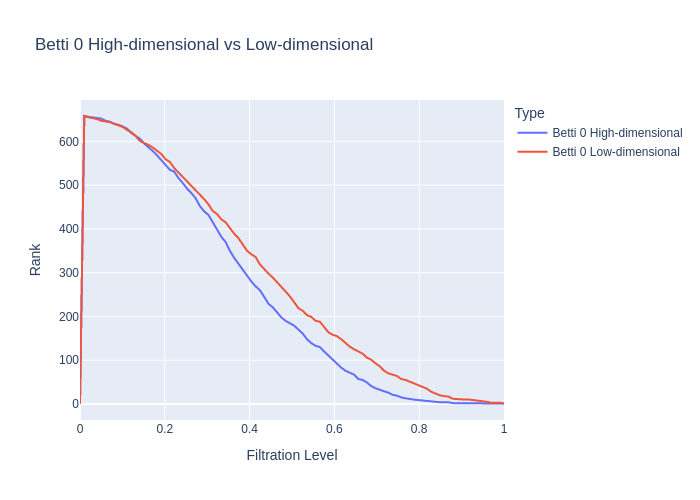

Distance `DTW` for dimension 0: 0.08497815295434173
Distance `TWED` for dimension 0: 0.16576161662892147
Distance `EMD` for dimension 0: 1.0742689642401125e-05
Distance `Wasserstein` for dimension 0: 0.009223625518467045
Distance `bottleneck` for dimension 0: 0.0885285958647728


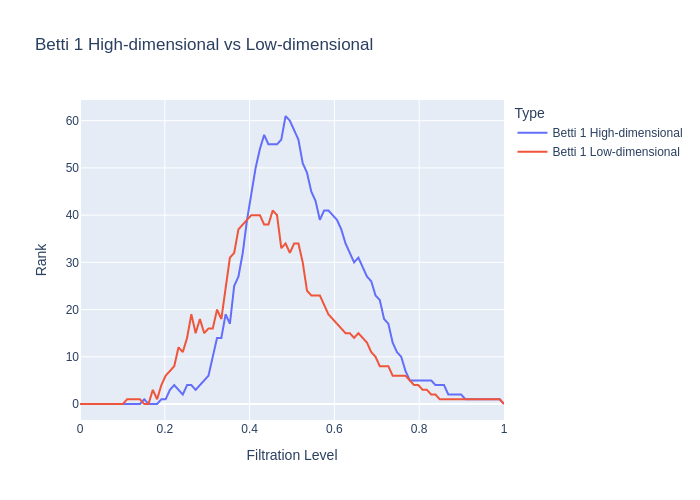

Distance `DTW` for dimension 1: 0.11172874448301331
Distance `TWED` for dimension 1: 0.08327422383230484
Distance `EMD` for dimension 1: 6.860719553395836e-05
Distance `Wasserstein` for dimension 1: 0.0023712671228289448
Distance `bottleneck` for dimension 1: 0.17029472440481186
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 1.9641755363915576
Neighborhood preservation score (mean, std): [0.06684086471796036, 0.052706532180309296]
Data has no labels: no context analysis performed


In [48]:
viz_benchmark(reducer_disk,
              features_disk,
              labels=labels_disk,
              dimension=1,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [49]:
benchmarks_disk = {}

In [50]:
benchmark = run_benchmark(reducer_disk,
                          features_disk,
                          labels=labels_disk,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_disk['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 16/16 [00:00<00:00, 32.33it/s]


### CuML tSNE reducer

Embedding time: 0.6328 seconds


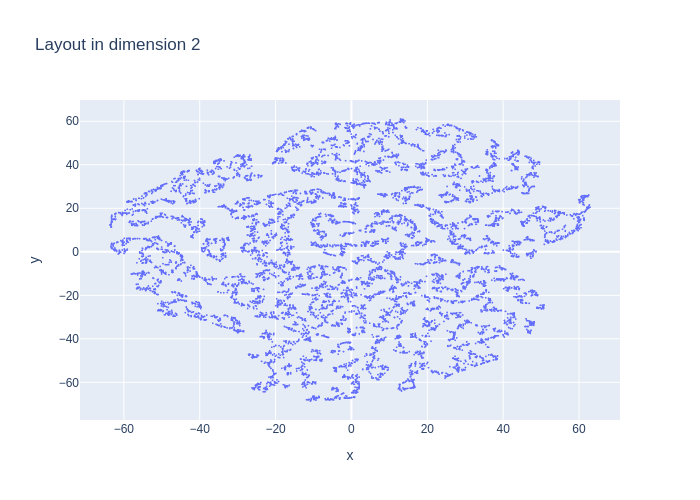

Computing persistence up to dimension 1 and global metrics
done


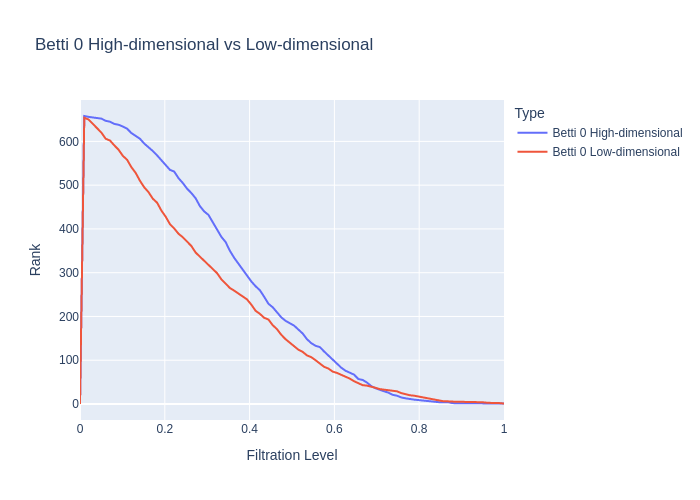

Distance `DTW` for dimension 0: 0.22165530597327096
Distance `TWED` for dimension 0: 0.20021975031158806
Distance `EMD` for dimension 0: 0.0008238871745782857
Distance `Wasserstein` for dimension 0: 0.4591413628396302
Distance `bottleneck` for dimension 0: 3.852729558944702


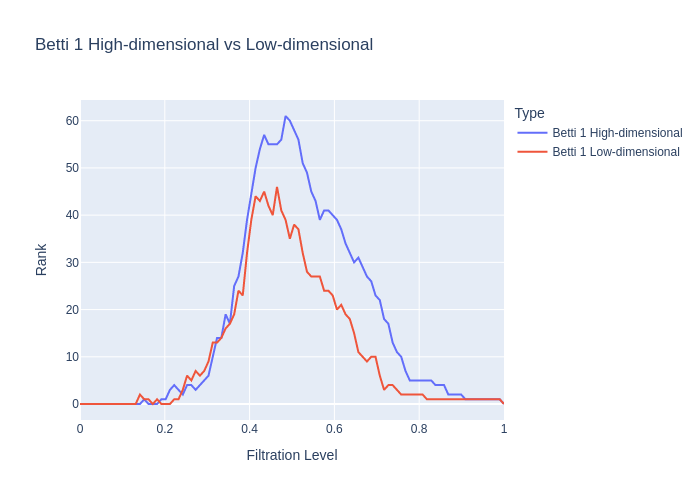

Distance `DTW` for dimension 1: 0.37972436570712836
Distance `TWED` for dimension 1: 0.07666148026165796
Distance `EMD` for dimension 1: 0.004752140019012059
Distance `Wasserstein` for dimension 1: 0.05186390365544491
Distance `bottleneck` for dimension 1: 3.597773313522339
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.011373776630635043
Neighborhood preservation score (mean, std): [0.18133828043937683, 0.13161766529083252]
Data has no labels: no context analysis performed


In [51]:
tred_disk = cTSNE(n_components=2,
                  method='fft',
                  perplexity=25,
                  n_neighbors=3*25+1)
#
viz_benchmark(tred_disk,
              features_disk,
              labels=labels_disk,
              dimension=1,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [52]:
benchmark = run_benchmark(tred_disk,
                          features_disk,
                          labels=labels_disk,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_disk['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### CuML UMAP reducer

Embedding time: 0.1177 seconds


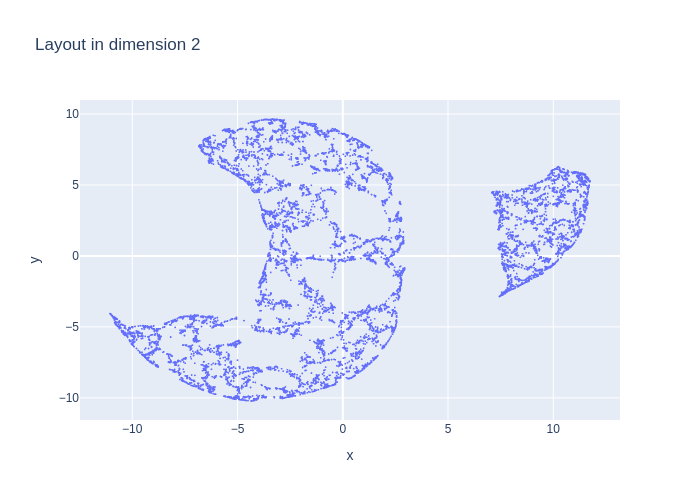

Computing persistence up to dimension 1 and global metrics
done


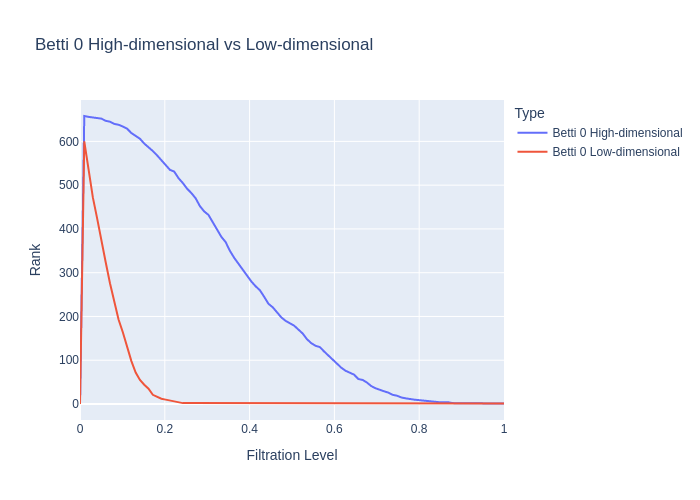

Distance `DTW` for dimension 0: 0.518492747433284
Distance `TWED` for dimension 0: 0.40158021681967415
Distance `EMD` for dimension 0: 0.000702951346325949
Distance `Wasserstein` for dimension 0: 0.05521031772711597
Distance `bottleneck` for dimension 0: 2.2167582511901855


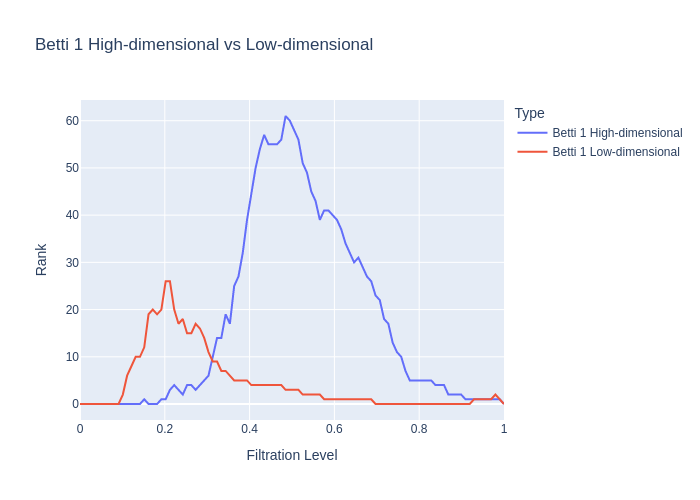

Distance `DTW` for dimension 1: 0.32134100530177473
Distance `TWED` for dimension 1: 0.09421658645808001
Distance `EMD` for dimension 1: 0.0018858068442777565
Distance `Wasserstein` for dimension 1: 0.007348720781537699
Distance `bottleneck` for dimension 1: 1.0838330388069153
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.299172217620326
Neighborhood preservation score (mean, std): [0.18127486109733582, 0.12802374362945557]
Data has no labels: no context analysis performed


In [53]:
cured_disk = cUMAP(n_components=reducer_disk.dimension,
                   n_neighbors=reducer_disk.n_neighbors,
                   min_dist=reducer_disk.min_dist,
                   spread=reducer_disk.spread)
#
viz_benchmark(cured_disk,
              features_disk,
              labels=labels_disk,
              dimension=1,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [54]:
benchmark = run_benchmark(cured_disk,
                          features_disk,
                          labels=labels_disk,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_disk['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 15.2056 seconds


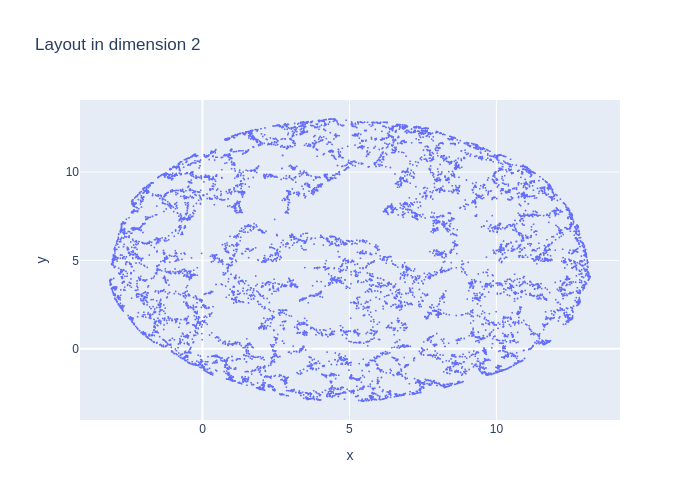

Computing persistence up to dimension 1 and global metrics
done


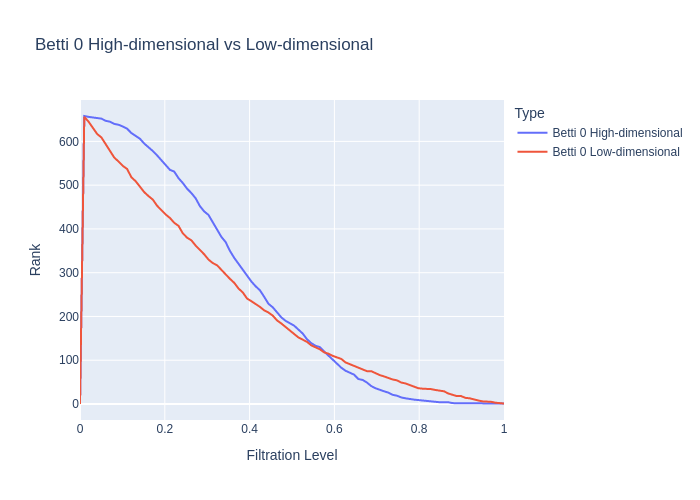

Distance `DTW` for dimension 0: 0.11523900679893846
Distance `TWED` for dimension 0: 0.2124722610651751
Distance `EMD` for dimension 0: 9.169826569871256e-05
Distance `Wasserstein` for dimension 0: 0.05721498080905765
Distance `bottleneck` for dimension 0: 0.45653530955314636


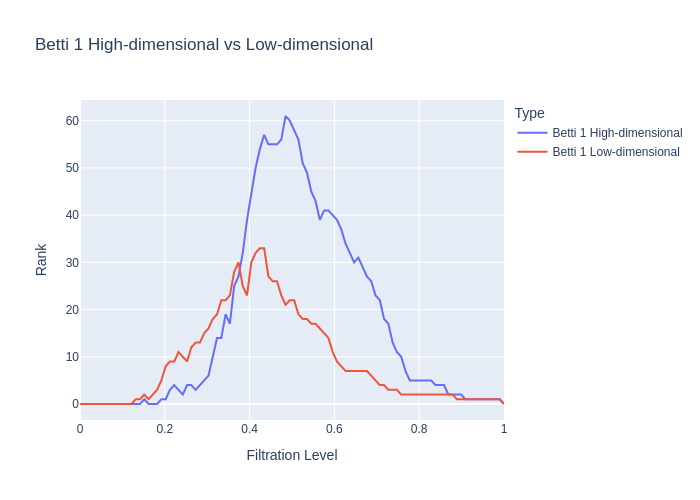

Distance `DTW` for dimension 1: 0.20985684101138632
Distance `TWED` for dimension 1: 0.09032431279638863
Distance `EMD` for dimension 1: 0.0008206825346910402
Distance `Wasserstein` for dimension 1: 0.008079588597153964
Distance `bottleneck` for dimension 1: 0.914197713136673
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.48843239046485637
Neighborhood preservation score (mean, std): [0.18982180953025818, 0.12861408293247223]
Data has no labels: no context analysis performed


In [55]:
red_disk = UMAP(n_components=reducer_disk.dimension,
                n_neighbors=reducer_disk.n_neighbors,
                min_dist=reducer_disk.min_dist,
                spread=reducer_disk.spread)
#
viz_benchmark(red_disk,
              features_disk,
              labels=labels_disk,
              dimension=1,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [56]:
benchmark = run_benchmark(red_disk,
                          features_disk,
                          labels=labels_disk,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_disk['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

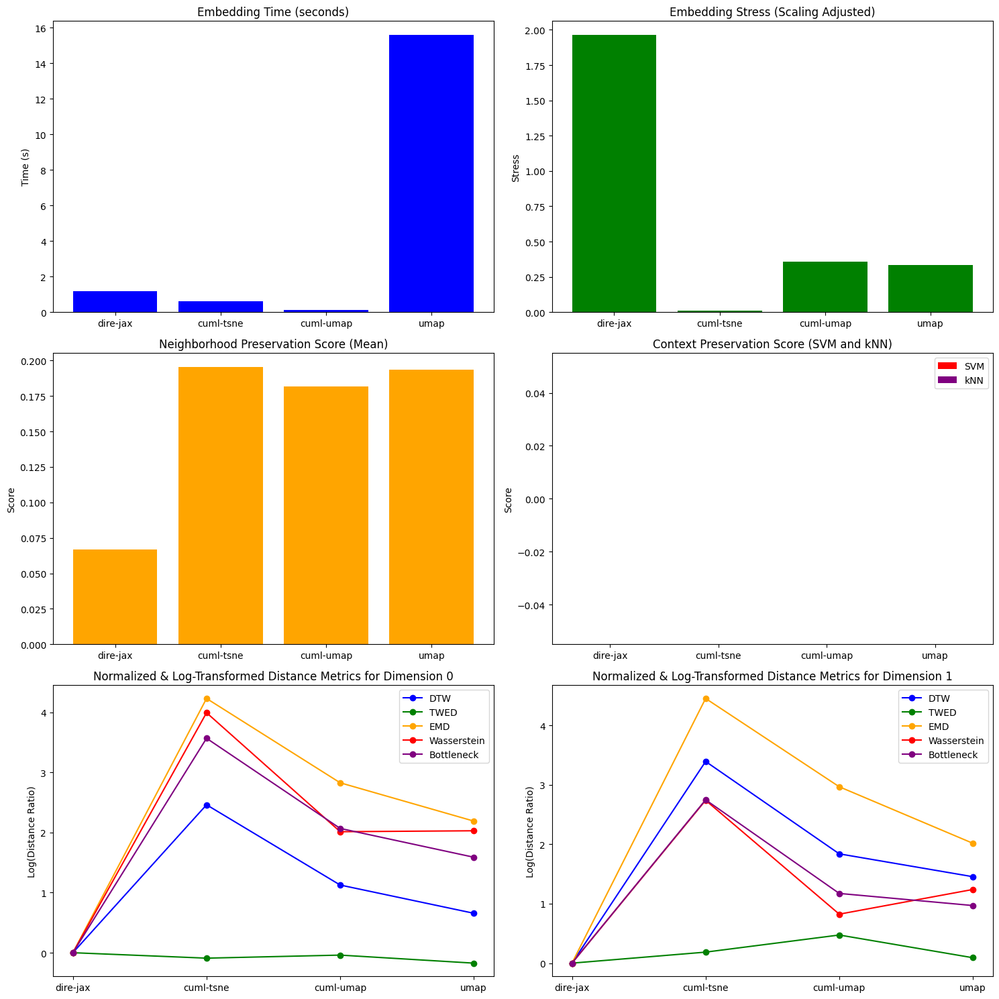

In [57]:
plot_algorithm_comparison(benchmarks_disk)

## Dataset "Sphere Uniform"

In [58]:
def rand_point_sphere(n, num=1):
  prepts = np.random.randn(num, n)
  prenorms = np.linalg.norm(prepts, axis=1).reshape(-1, 1)
  pts = prepts/prenorms
  return pts

In [59]:
features_sphere, labels_sphere = rand_point_sphere(3, 10000), None

### DiRe reducer

In [60]:
reducer_sphere = DiRe(dimension=3,
                      n_neighbors=64,
                      init_embedding_type='pca',
                      max_iter_layout=32,
                      min_dist=1e-4,
                      spread=2.0,
                      cutoff=2.0,
                      n_sample_dirs=8,
                      sample_size=32,
                      neg_ratio=8,
                      verbose=False,)

100%|██████████| 32/32 [00:01<00:00, 17.02it/s]


Embedding time: 2.7626 seconds


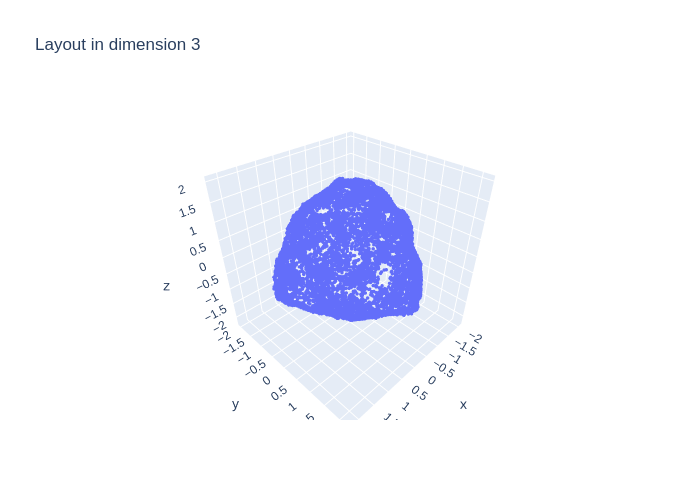

Computing persistence up to dimension 1 and global metrics
done


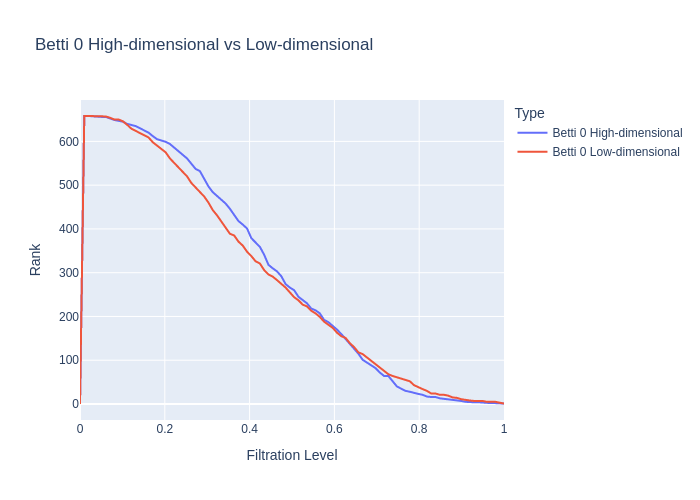

Distance `DTW` for dimension 0: 0.10205081312351333
Distance `TWED` for dimension 0: 0.20000427483584632
Distance `EMD` for dimension 0: 1.6029992538273702e-05
Distance `Wasserstein` for dimension 0: 0.014710699331123674
Distance `bottleneck` for dimension 0: 0.15472882986068726


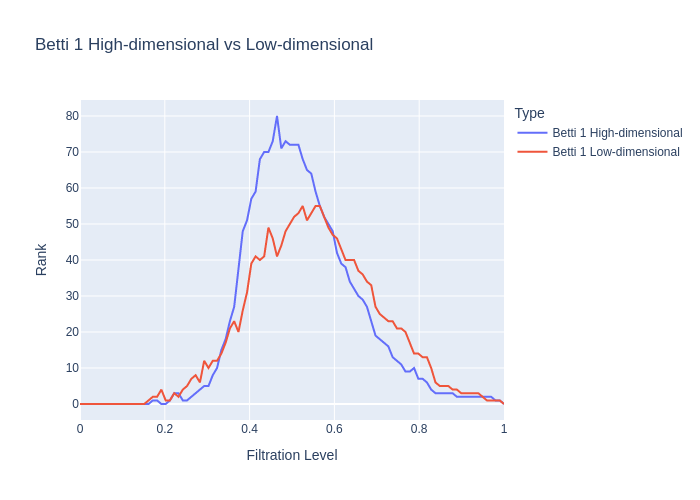

Distance `DTW` for dimension 1: 0.12740797683772
Distance `TWED` for dimension 1: 0.10117569860317364
Distance `EMD` for dimension 1: 8.93523279782817e-05
Distance `Wasserstein` for dimension 1: 0.005433736946793392
Distance `bottleneck` for dimension 1: 0.22178137302398682
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.5407009958709266
Neighborhood preservation score (mean, std): [0.2439391016960144, 0.14806856215000153]
Data has no labels: no context analysis performed


In [61]:
viz_benchmark(reducer_sphere,
              features_sphere,
              labels=labels_sphere,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [62]:
benchmarks_sphere = {}

In [63]:
benchmark = run_benchmark(reducer_sphere,
                          features_sphere,
                          labels=labels_sphere,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_sphere['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 32/32 [00:00<00:00, 36.07it/s]


### CuML tSNE reducer

Embedding time: 0.6606 seconds


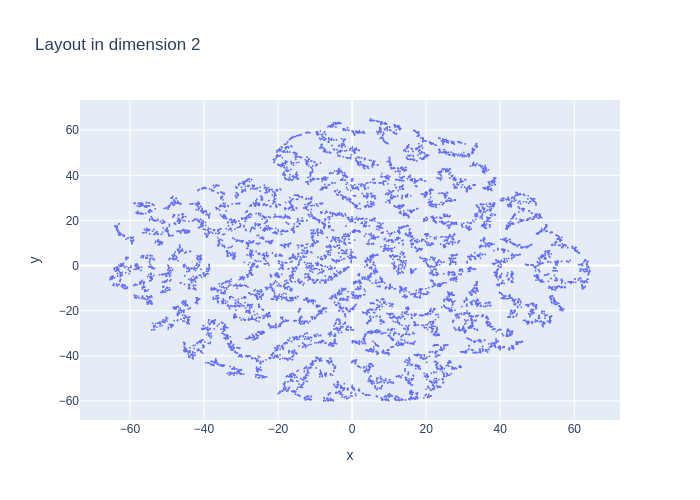

Computing persistence up to dimension 1 and global metrics
done


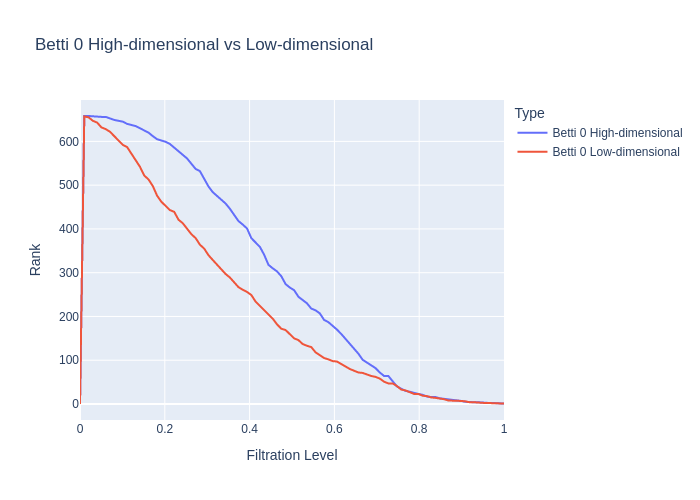

Distance `DTW` for dimension 0: 0.20627437644491123
Distance `TWED` for dimension 0: 0.21266049633694067
Distance `EMD` for dimension 0: 0.000887444366287777
Distance `Wasserstein` for dimension 0: 0.47692094484052255
Distance `bottleneck` for dimension 0: 3.6675002574920654


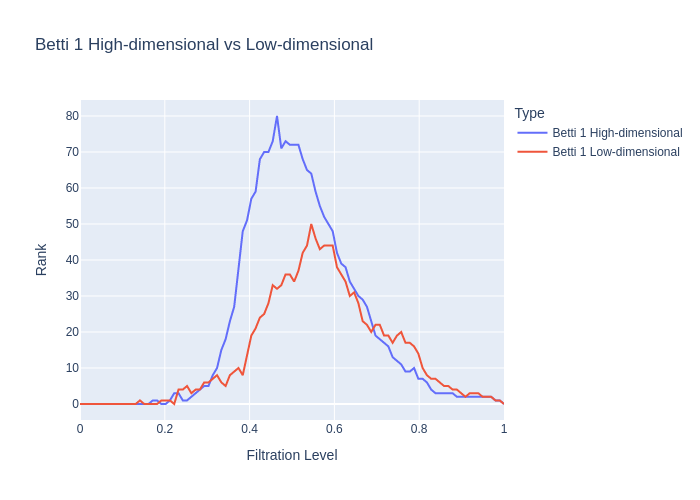

Distance `DTW` for dimension 1: 0.3931616856992096
Distance `TWED` for dimension 1: 0.09604543841766477
Distance `EMD` for dimension 1: 0.00436769067738939
Distance `Wasserstein` for dimension 1: 0.053801206290351775
Distance `bottleneck` for dimension 1: 3.106977939605713
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.023427556830749142
Neighborhood preservation score (mean, std): [0.16086800396442413, 0.12144032120704651]
Data has no labels: no context analysis performed


In [64]:
tred_sphere = cTSNE(n_components=2,
                    method='fft',
                    perplexity=25,
                    n_neighbors=3*25+1)
#
viz_benchmark(tred_sphere,
              features_sphere,
              labels=labels_sphere,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [65]:
benchmark = run_benchmark(tred_sphere,
                          features_sphere,
                          labels=labels_sphere,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_sphere['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### CuML UMAP reducer

Embedding time: 0.1386 seconds


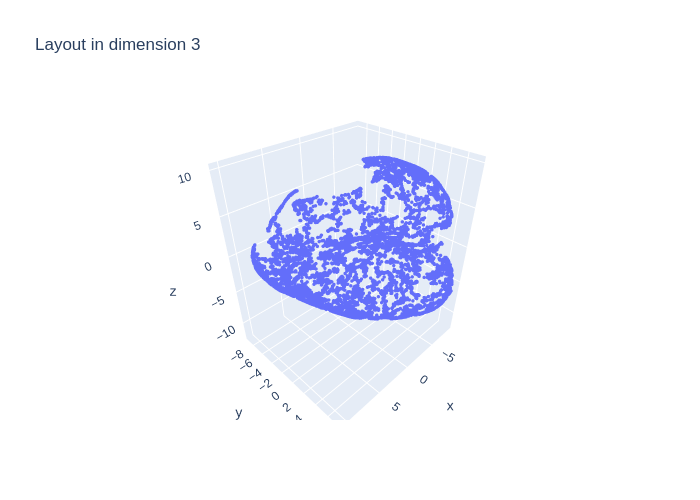

Computing persistence up to dimension 1 and global metrics
done


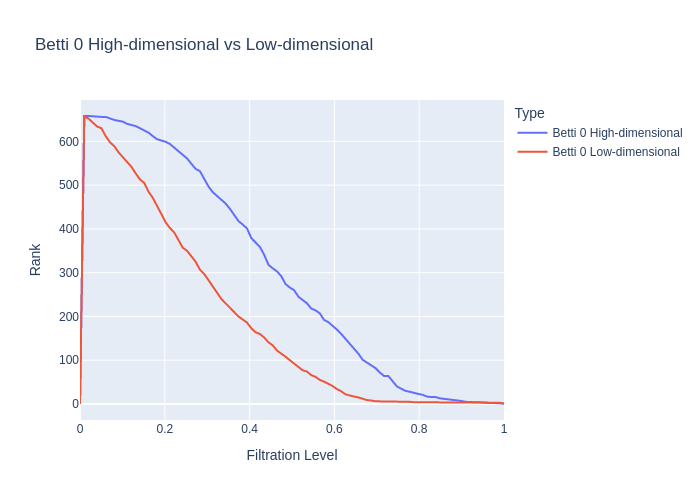

Distance `DTW` for dimension 0: 0.13775032066656906
Distance `TWED` for dimension 0: 0.23427777123358465
Distance `EMD` for dimension 0: 0.00021671162486524762
Distance `Wasserstein` for dimension 0: 0.10778625948421967
Distance `bottleneck` for dimension 0: 1.0047128200531006


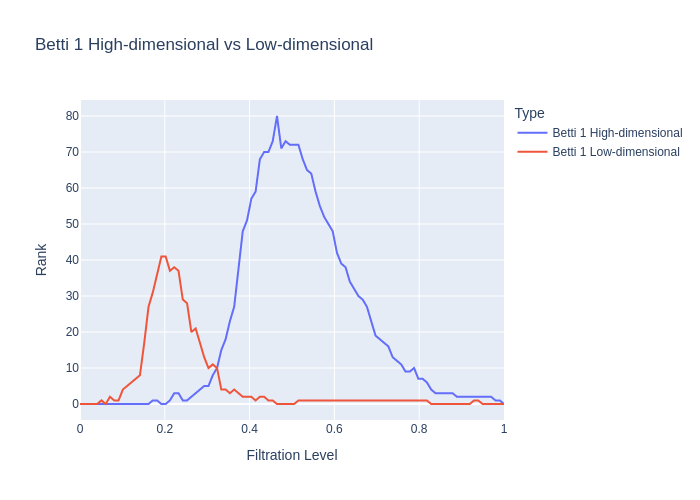

Distance `DTW` for dimension 1: 0.358492233896731
Distance `TWED` for dimension 1: 0.10978672606471912
Distance `EMD` for dimension 1: 0.0026259410779745506
Distance `Wasserstein` for dimension 1: 0.015556993035924142
Distance `bottleneck` for dimension 1: 1.319972038269043
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.1857527680517652
Neighborhood preservation score (mean, std): [0.2057497203350067, 0.14081089198589325]
Data has no labels: no context analysis performed


In [66]:
cured_sphere = cUMAP(n_components=reducer_sphere.dimension,
                     n_neighbors=reducer_sphere.n_neighbors,
                     min_dist=reducer_sphere.min_dist,
                     spread=reducer_sphere.spread)
#
viz_benchmark(cured_sphere,
              features_sphere,
              labels=labels_sphere,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [67]:
benchmark = run_benchmark(cured_sphere,
                          features_sphere,
                          labels=labels_sphere,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_sphere['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 16.0237 seconds


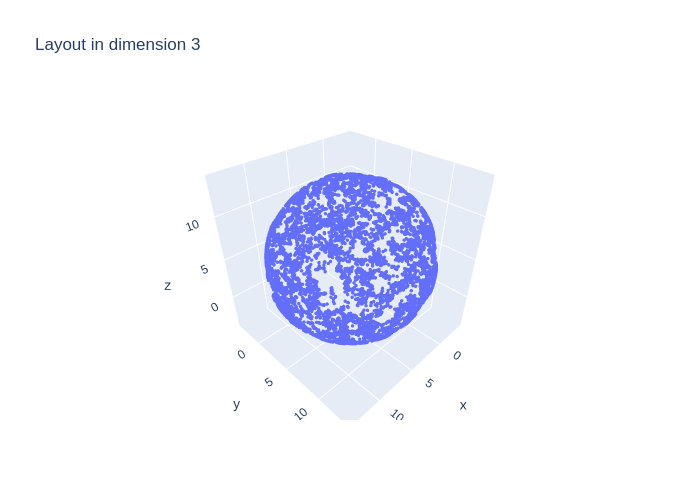

Computing persistence up to dimension 1 and global metrics
done


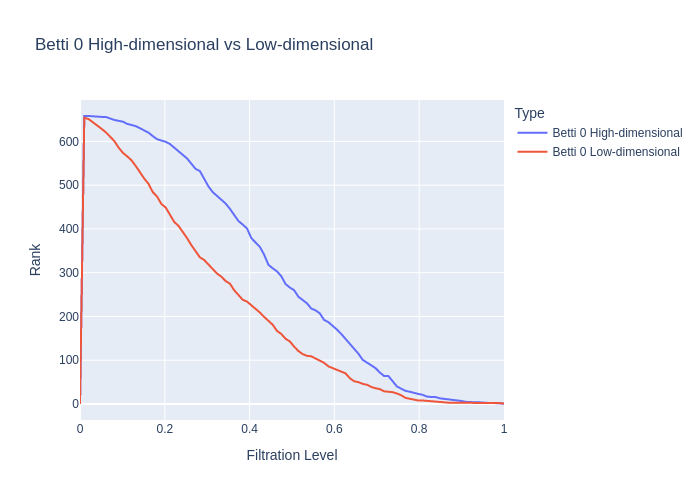

Distance `DTW` for dimension 0: 0.1322530891615796
Distance `TWED` for dimension 0: 0.2023805610864543
Distance `EMD` for dimension 0: 0.00022831003765564297
Distance `Wasserstein` for dimension 0: 0.12543969654336487
Distance `bottleneck` for dimension 0: 1.0315210819244385


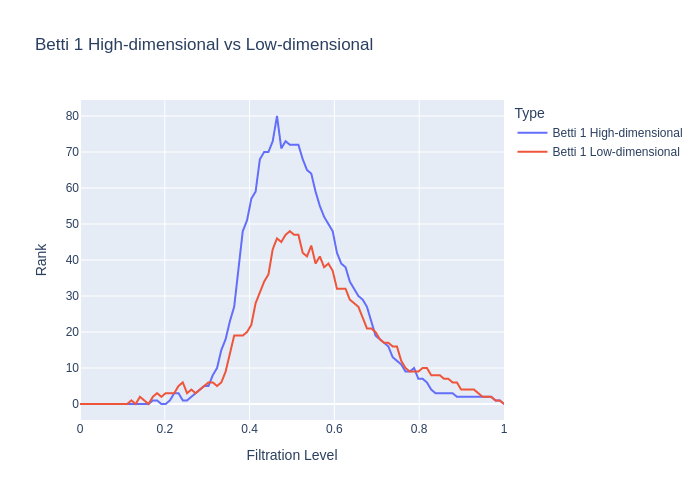

Distance `DTW` for dimension 1: 0.222729872956252
Distance `TWED` for dimension 1: 0.09191329896681968
Distance `EMD` for dimension 1: 0.0011258851353816318
Distance `Wasserstein` for dimension 1: 0.019315402466496514
Distance `bottleneck` for dimension 1: 1.2397159934043884
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.10781075855317239
Neighborhood preservation score (mean, std): [0.22111204266548157, 0.15042848885059357]
Data has no labels: no context analysis performed


In [68]:
red_sphere = UMAP(n_components=reducer_sphere.dimension,
                  n_neighbors=reducer_sphere.n_neighbors,
                  min_dist=reducer_sphere.min_dist,
                  spread=reducer_sphere.spread)
#
viz_benchmark(red_sphere,
              features_sphere,
              labels=labels_sphere,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [69]:
benchmark = run_benchmark(red_sphere,
                          features_sphere,
                          labels=labels_sphere,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_sphere['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

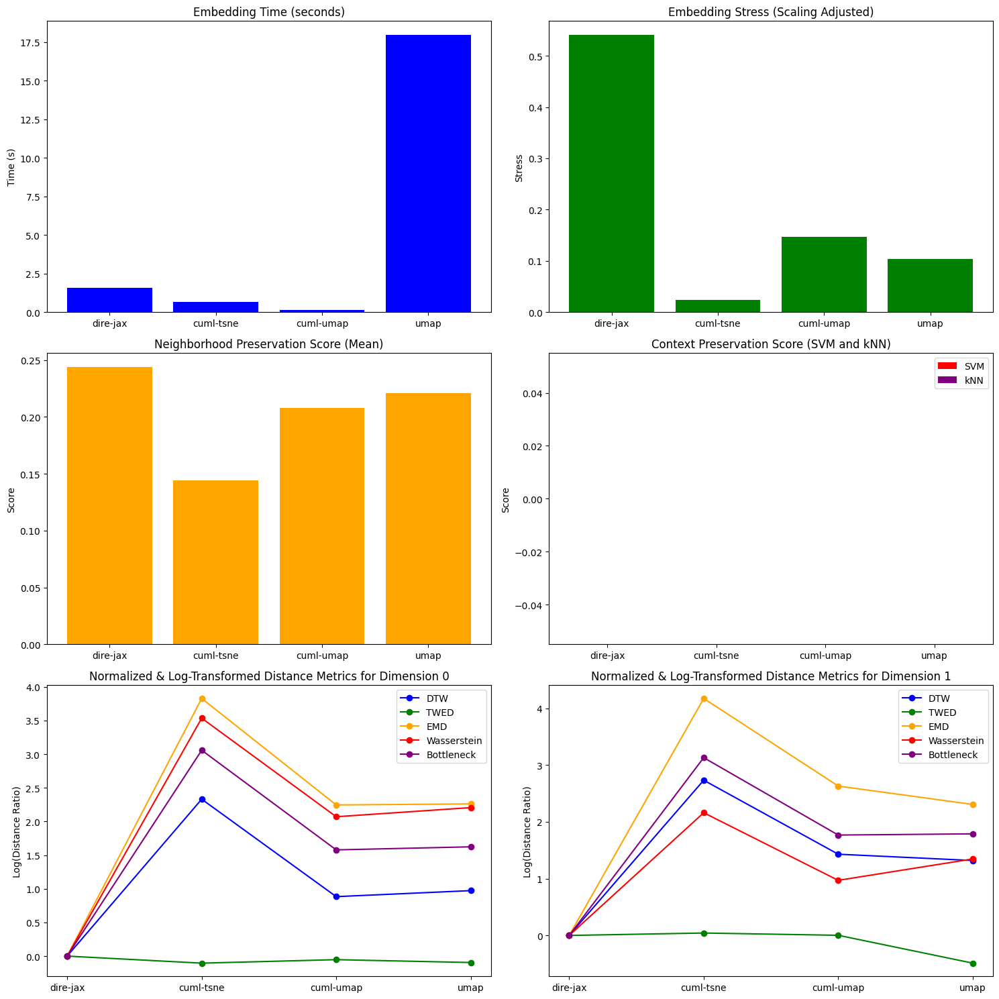

In [70]:
plot_algorithm_comparison(benchmarks_sphere)

## Dataset "Ellipsoid Uniform"

In [71]:
class elgen:
  def __init__(self, a):
    a = np.array(a)
    themat = np.diag(1/(a * a))
    L = np.linalg.inv(np.linalg.cholesky(themat).T)
    self.L = L

  def __call__(self, ar):
    return (self.L @ ar.T).T

def rand_point_ell(a, n, num=1):
  spts = rand_point_sphere(n, num)
  eg = elgen(a)
  return eg(spts)

In [72]:
features_ell, labels_ell = rand_point_ell([1,2,4], 3, 10000), None

### DiRe reducer

In [73]:
reducer_ell = DiRe(dimension=3,
                   n_neighbors=64,
                   init_embedding_type='pca',
                   max_iter_layout=64,
                   min_dist=1e-4,
                   spread=1.0,
                   cutoff=4.0,
                   n_sample_dirs=8,
                   sample_size=32,
                   neg_ratio=8,
                   verbose=False,)

100%|██████████| 64/64 [00:01<00:00, 39.13it/s]


Embedding time: 2.3385 seconds


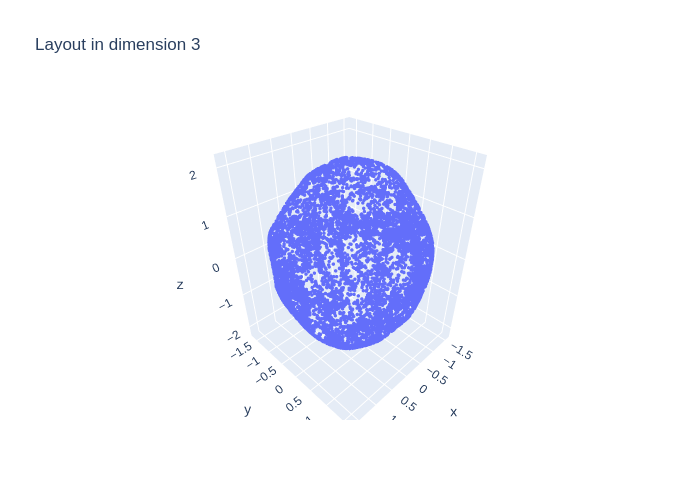

Computing persistence up to dimension 1 and global metrics
done


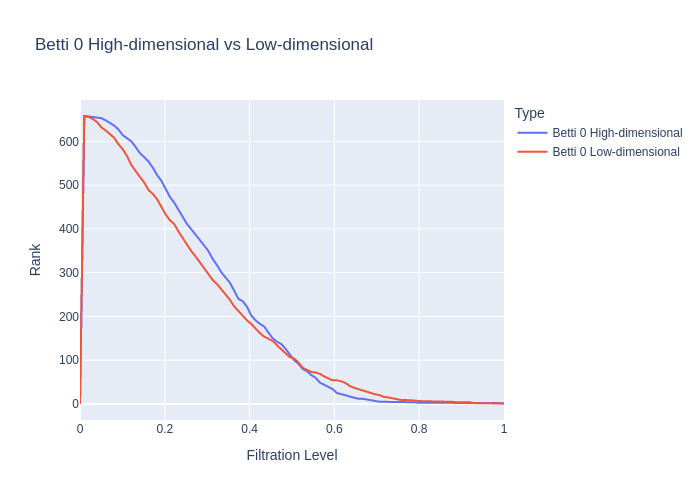

Distance `DTW` for dimension 0: 0.10924293813913821
Distance `TWED` for dimension 0: 0.2116764291251216
Distance `EMD` for dimension 0: 1.0750189672274486e-05
Distance `Wasserstein` for dimension 0: 0.012809283884898378
Distance `bottleneck` for dimension 0: 0.15411987900733948


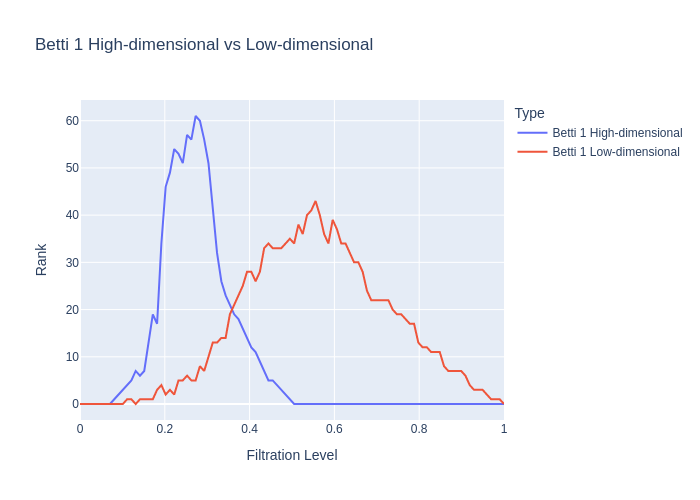

Distance `DTW` for dimension 1: 0.10681586831207164
Distance `TWED` for dimension 1: 0.10739597661949782
Distance `EMD` for dimension 1: 4.504426480518447e-05
Distance `Wasserstein` for dimension 1: 0.002948475100031309
Distance `bottleneck` for dimension 1: 0.16421550512313843
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 1.1775590701483711
Neighborhood preservation score (mean, std): [0.18668897449970245, 0.12624625861644745]
Data has no labels: no context analysis performed


In [74]:
viz_benchmark(reducer_ell,
              features_ell,
              labels=labels_ell,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [75]:
benchmarks_ell = {}

In [76]:
benchmark = run_benchmark(reducer_ell,
                          features_ell,
                          labels=labels_ell,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_ell['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 64/64 [00:01<00:00, 37.87it/s]


### CuML tSNE reducer

Embedding time: 0.6764 seconds


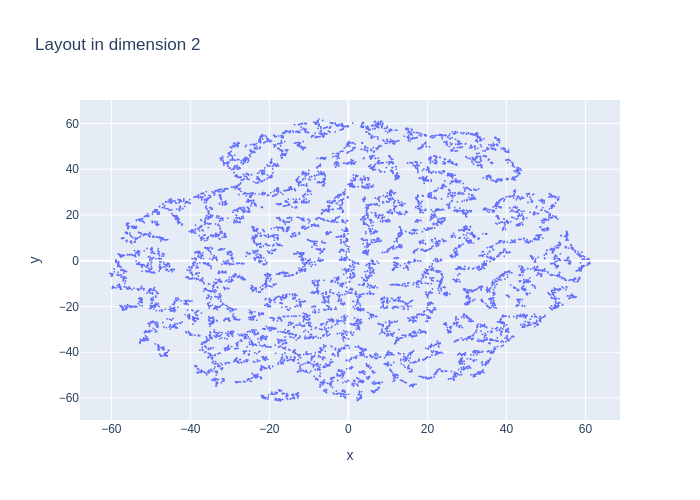

Computing persistence up to dimension 1 and global metrics
done


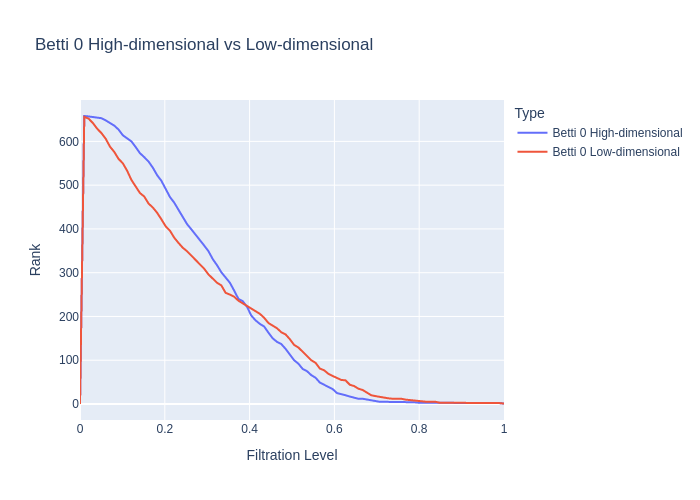

Distance `DTW` for dimension 0: 0.2367283650237494
Distance `TWED` for dimension 0: 0.2235328288393726
Distance `EMD` for dimension 0: 0.0006972471516620942
Distance `Wasserstein` for dimension 0: 0.4617595145182178
Distance `bottleneck` for dimension 0: 4.040191173553467


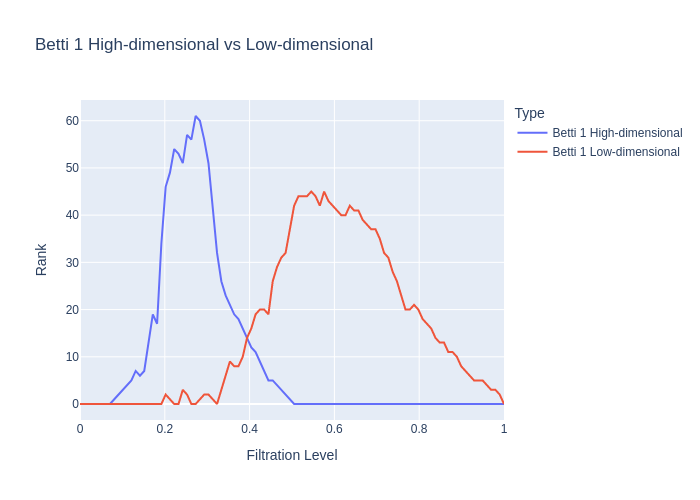

Distance `DTW` for dimension 1: 0.45071178032289355
Distance `TWED` for dimension 1: 0.1099137361875304
Distance `EMD` for dimension 1: 0.004596550864649457
Distance `Wasserstein` for dimension 1: 0.06114380764680114
Distance `bottleneck` for dimension 1: 3.445183277130127
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.05579743692180456
Neighborhood preservation score (mean, std): [0.15728798508644104, 0.11922980844974518]
Data has no labels: no context analysis performed


In [77]:
tred_ell = cTSNE(n_components=2,
                 method='fft',
                 perplexity=25,
                 n_neighbors=3*25+1)
#
viz_benchmark(tred_ell,
              features_ell,
              labels=labels_ell,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [78]:
benchmark = run_benchmark(tred_ell,
                          features_ell,
                          labels=labels_ell,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_ell['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### CuML UMAP reducer

Embedding time: 0.1464 seconds


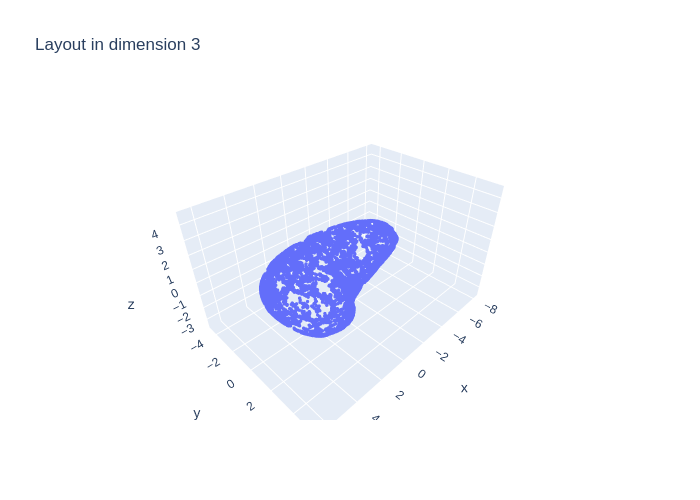

Computing persistence up to dimension 1 and global metrics
done


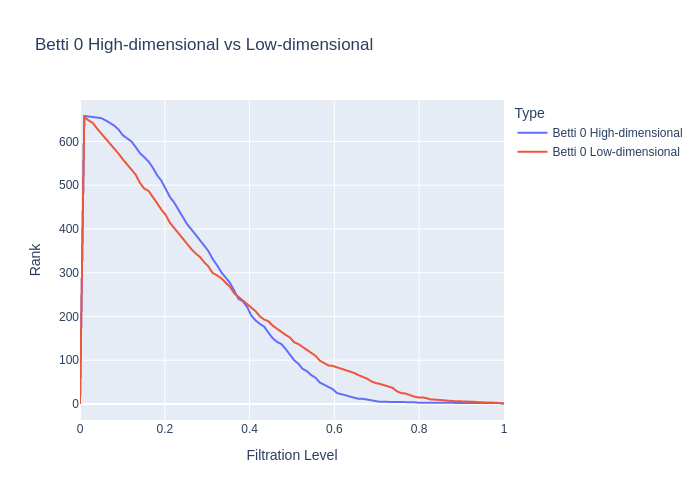

Distance `DTW` for dimension 0: 0.0985318129227123
Distance `TWED` for dimension 0: 0.1922291440258694
Distance `EMD` for dimension 0: 4.480096240468199e-05
Distance `Wasserstein` for dimension 0: 0.032918669399851934
Distance `bottleneck` for dimension 0: 0.4781075716018677


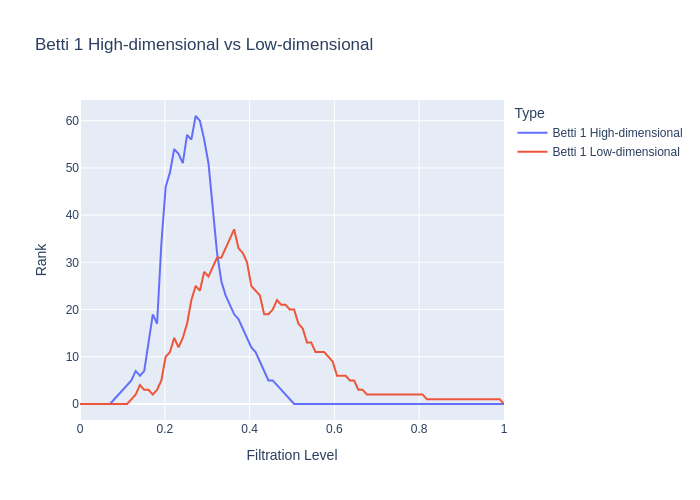

Distance `DTW` for dimension 1: 0.14213051274361063
Distance `TWED` for dimension 1: 0.1042966018854876
Distance `EMD` for dimension 1: 0.00025746127589157814
Distance `Wasserstein` for dimension 1: 0.010568296919194453
Distance `bottleneck` for dimension 1: 0.9845868051052094
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.9048429516768827
Neighborhood preservation score (mean, std): [0.21387979388237, 0.14742818474769592]
Data has no labels: no context analysis performed


In [79]:
cured_ell = cUMAP(n_components=reducer_ell.dimension,
                  n_neighbors=reducer_ell.n_neighbors,
                  min_dist=reducer_ell.min_dist,
                  spread=reducer_ell.spread)
#
viz_benchmark(cured_ell,
              features_ell,
              labels=labels_ell,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [80]:
benchmark = run_benchmark(cured_ell,
                          features_ell,
                          labels=labels_ell,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_ell['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 18.6225 seconds


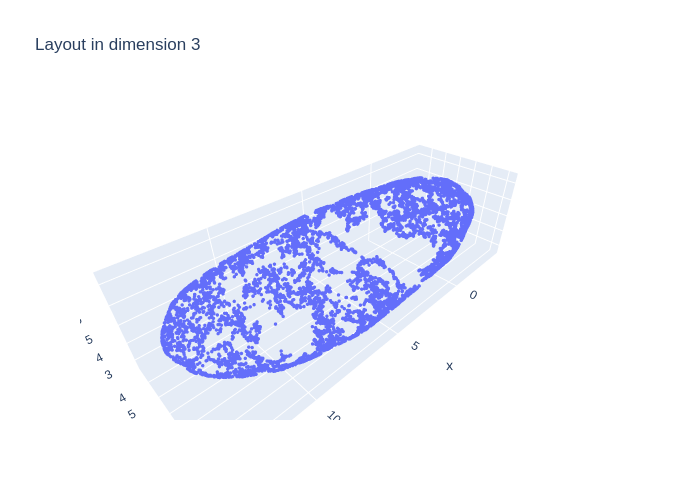

Computing persistence up to dimension 1 and global metrics
done


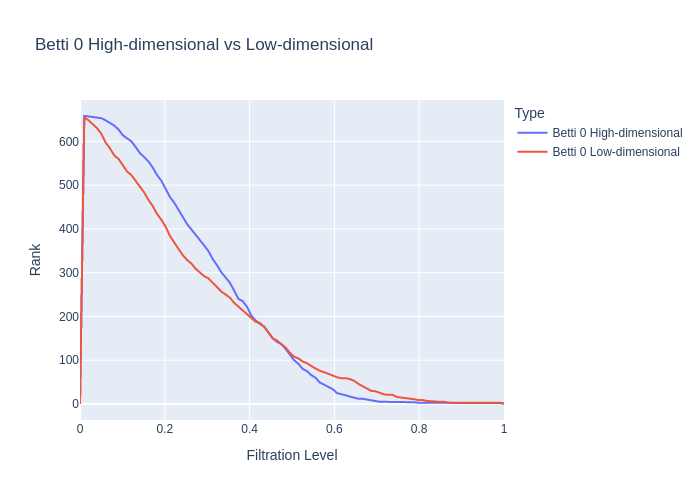

Distance `DTW` for dimension 0: 0.1165103244276815
Distance `TWED` for dimension 0: 0.22024754624422424
Distance `EMD` for dimension 0: 4.750240852437696e-05
Distance `Wasserstein` for dimension 0: 0.03150192761772835
Distance `bottleneck` for dimension 0: 0.4767304062843323


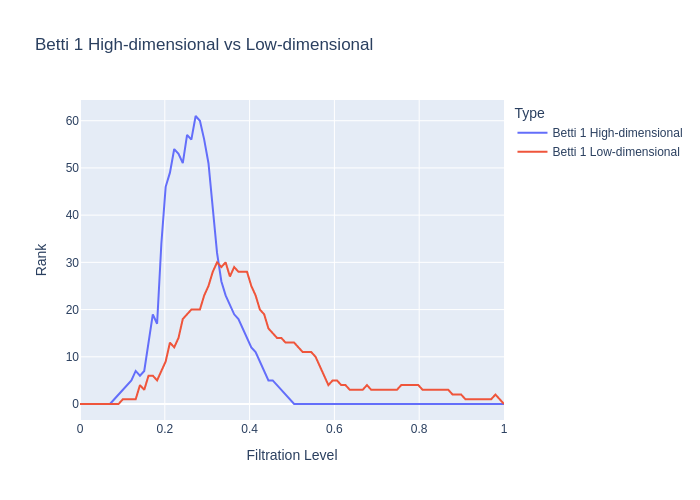

Distance `DTW` for dimension 1: 0.18203013081555786
Distance `TWED` for dimension 1: 0.10507518011308367
Distance `EMD` for dimension 1: 0.00033217144003442147
Distance `Wasserstein` for dimension 1: 0.010527869686732126
Distance `bottleneck` for dimension 1: 0.9463643729686737
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.9733575158110698
Neighborhood preservation score (mean, std): [0.21069690585136414, 0.14516663551330566]
Data has no labels: no context analysis performed


In [81]:
red_ell = UMAP(n_components=reducer_ell.dimension,
               n_neighbors=reducer_ell.n_neighbors,
               min_dist=reducer_ell.min_dist,
               spread=reducer_ell.spread)
#
viz_benchmark(red_ell,
              features_ell,
              labels=labels_ell,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [82]:
benchmark = run_benchmark(red_ell,
                          features_ell,
                          labels=labels_ell,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_ell['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

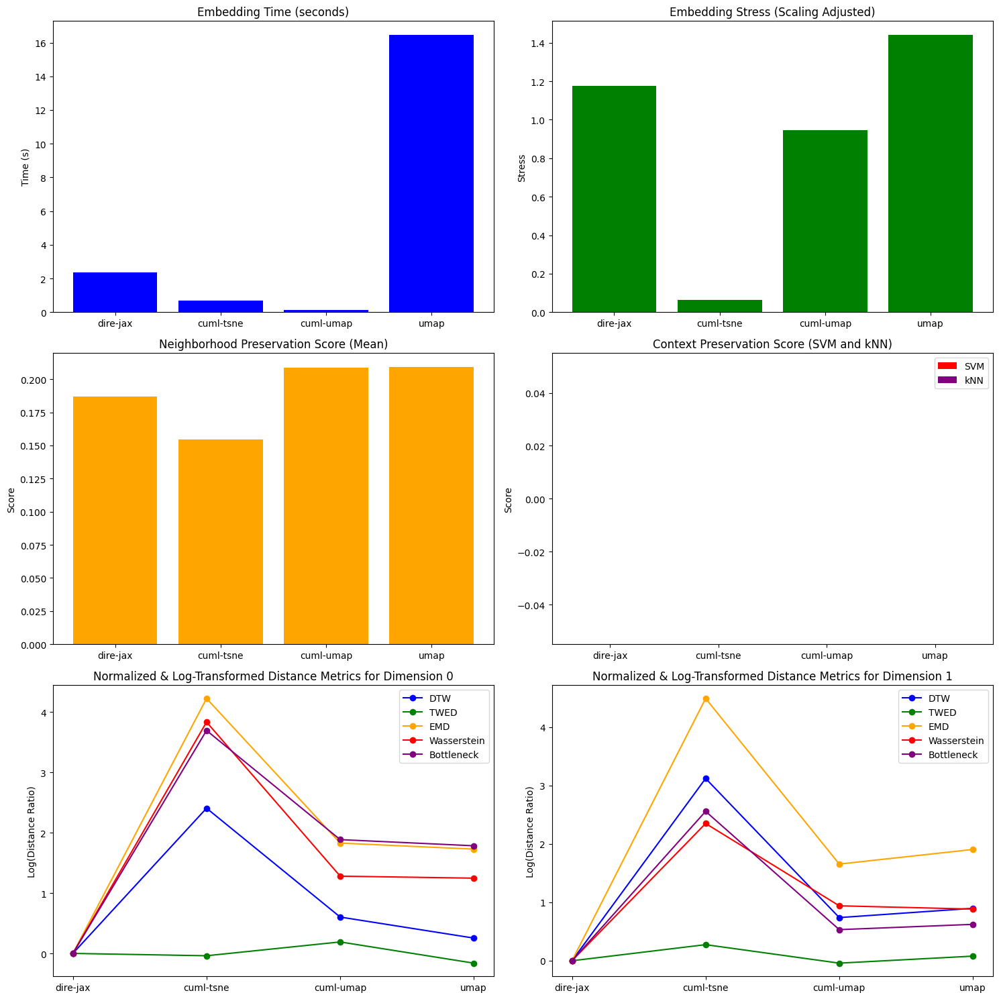

In [83]:
plot_algorithm_comparison(benchmarks_ell)

## Dataset "Two half-moons"

In [159]:
from sklearn.datasets import make_moons
#
# Generate some sample data
#
n_samples  = 10_000
features_moons, labels_moons = make_moons(n_samples=n_samples, noise=0.005, random_state=42)

### DiRe reducer

In [160]:
reducer_moons = DiRe(dimension=2,
                     n_neighbors=64,
                     init_embedding_type='pca',
                     max_iter_layout=128,
                     min_dist=1e-4,
                     spread=1.0,
                     cutoff=8.0,
                     n_sample_dirs=16,
                     sample_size=16,
                     neg_ratio=16,
                     verbose=False,)

100%|██████████| 128/128 [00:06<00:00, 21.00it/s]


Embedding time: 6.8633 seconds


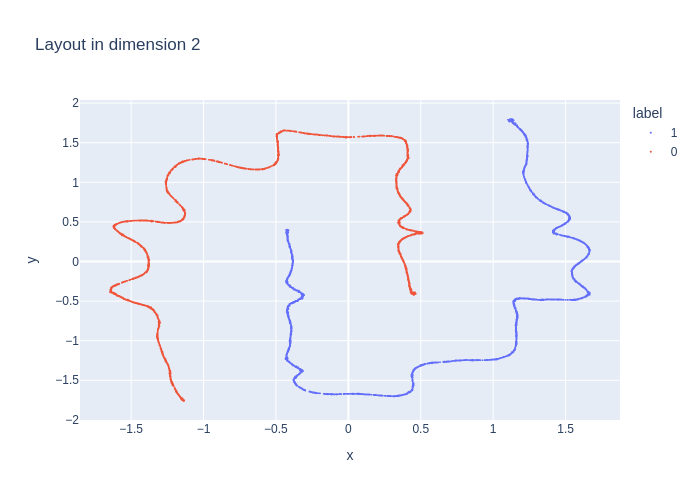

Computing persistence up to dimension 1 and global metrics
done


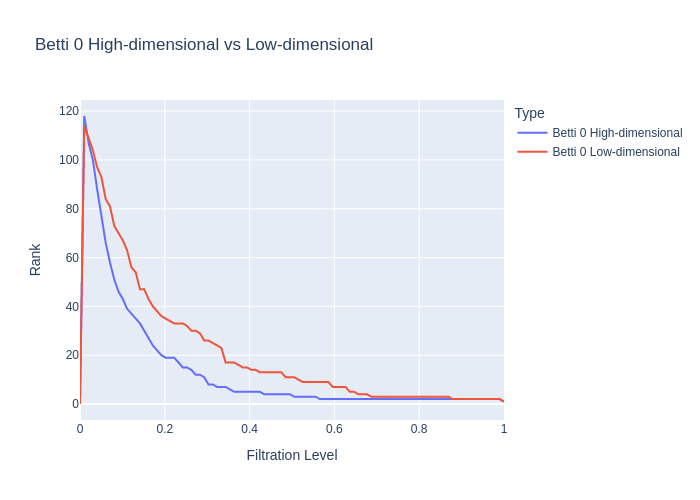

Distance `DTW` for dimension 0: 0.09919256449845903
Distance `TWED` for dimension 0: 0.1936903868517048
Distance `EMD` for dimension 0: 0.00010603921595132962
Distance `Wasserstein` for dimension 0: 0.006928269868611371
Distance `bottleneck` for dimension 0: 0.3198554813861847


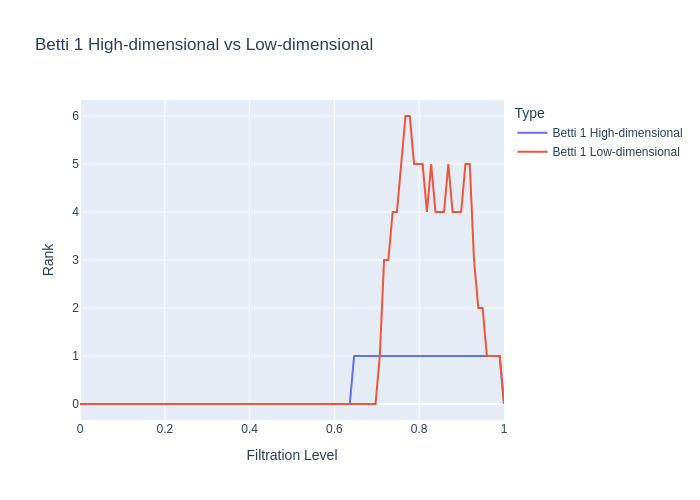

Distance `DTW` for dimension 1: 0.0781917014121512
Distance `TWED` for dimension 1: 0.07095976232453709
Distance `EMD` for dimension 1: 0.0005348505823817832
Distance `Wasserstein` for dimension 1: 0.0008465808789010856
Distance `bottleneck` for dimension 1: 0.15454337000846863
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.6703845710996963
Neighborhood preservation score (mean, std): [0.3838418126106262, 0.2262396663427353]
Computing context measures
done
Context preservation score (SVM): [0.9073482428115016, 0.8242811501597445, -0.0960146532395886]
Context preservation score (kNN): [1.0, 1.0, 0.0]


In [161]:
viz_benchmark(reducer_moons,
              features_moons,
              labels=labels_moons,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [162]:
benchmarks_moons = {}

In [163]:
benchmark = run_benchmark(reducer_moons,
                          features_moons,
                          labels=labels_moons,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_moons['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 128/128 [00:05<00:00, 22.77it/s]


### CuML tSNE reducer

Embedding time: 0.7158 seconds


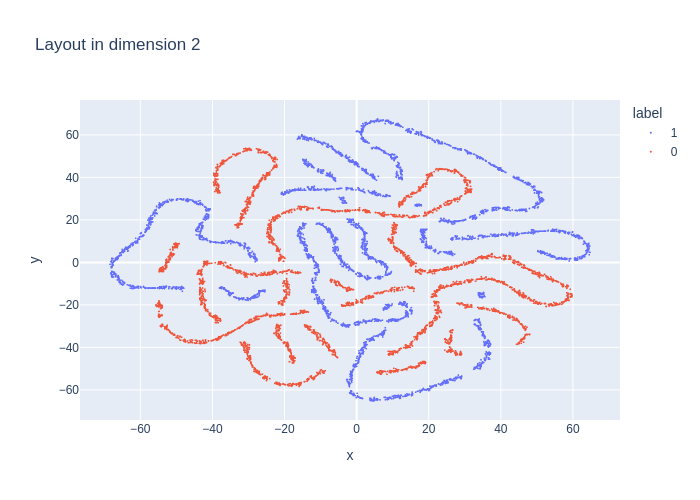

Computing persistence up to dimension 1 and global metrics
done


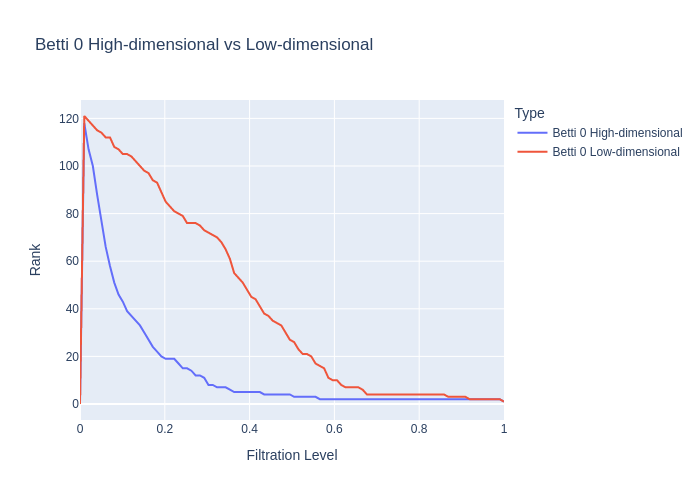

Distance `DTW` for dimension 0: 1.38338211961505
Distance `TWED` for dimension 0: 0.2178817705134303
Distance `EMD` for dimension 0: 0.01340429174408569
Distance `Wasserstein` for dimension 0: 0.5634197113301704
Distance `bottleneck` for dimension 0: 10.055683135986328


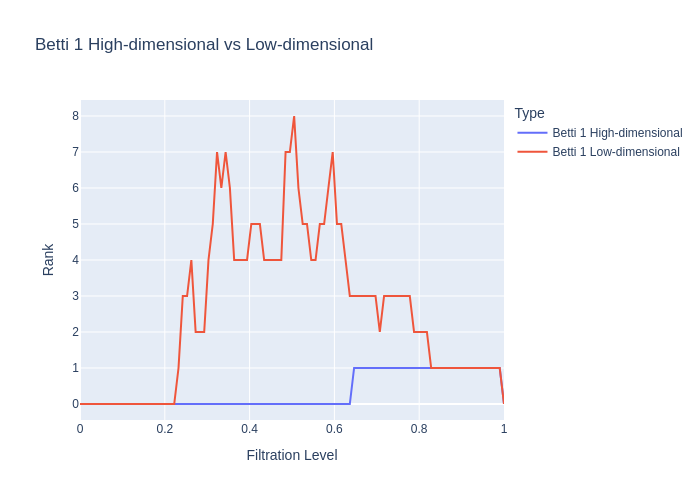

Distance `DTW` for dimension 1: 1.6584201130565073
Distance `TWED` for dimension 1: 0.14509194832177313
Distance `EMD` for dimension 1: 0.12660972160129358
Distance `Wasserstein` for dimension 1: 0.06287602955170708
Distance `bottleneck` for dimension 1: 7.601925373077393
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.0042528790855202265
Neighborhood preservation score (mean, std): [0.3802954852581024, 0.2641392648220062]
Computing context measures
done
Context preservation score (SVM): [0.9073482428115016, 0.5718849840255591, -0.4615884323204511]
Context preservation score (kNN): [1.0, 0.9853333333333333, -0.014775285582154402]


In [164]:
tred_moons = cTSNE(n_components=2,
                   method='fft',
                   perplexity=25,
                   n_neighbors=3*25+1)
#
viz_benchmark(tred_moons,
              features_moons,
              labels=labels_moons,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [165]:
benchmark = run_benchmark(tred_moons,
                          features_moons,
                          labels=labels_moons,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_moons['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### CuML UMAP reducer

Embedding time: 0.1165 seconds


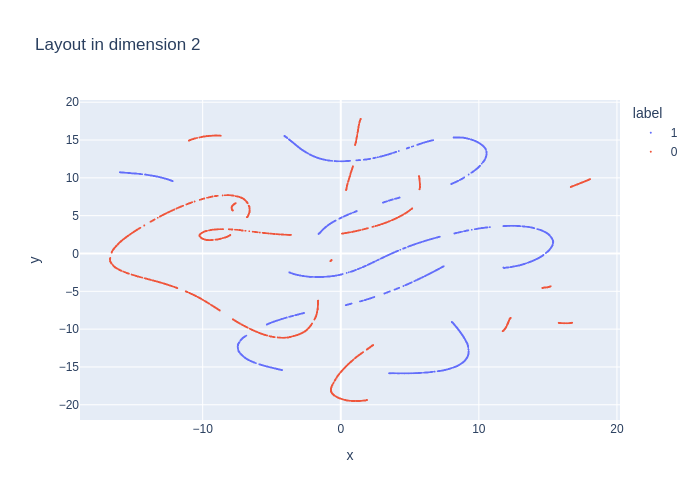

Computing persistence up to dimension 1 and global metrics
done


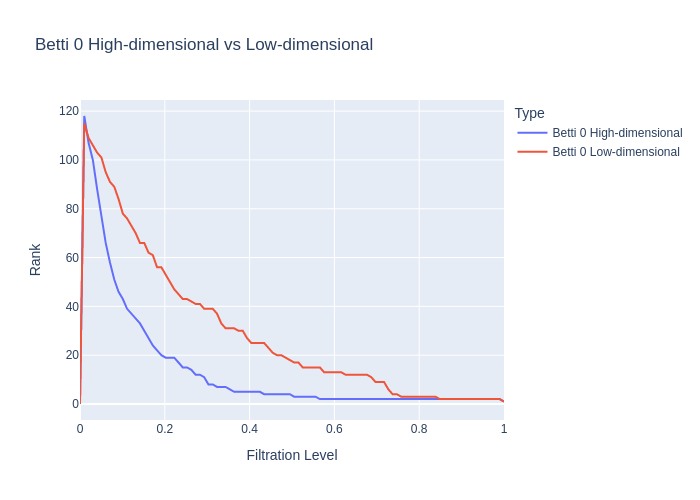

Distance `DTW` for dimension 0: 0.49948459466635964
Distance `TWED` for dimension 0: 0.1882900190490547
Distance `EMD` for dimension 0: 0.0029266461040152007
Distance `Wasserstein` for dimension 0: 0.12695984431246757
Distance `bottleneck` for dimension 0: 3.237057685852051


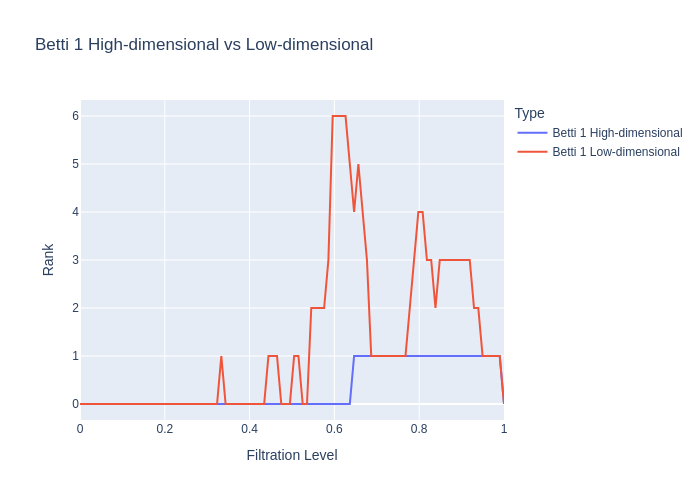

Distance `DTW` for dimension 1: 0.3712531562280967
Distance `TWED` for dimension 1: 0.08666458934516943
Distance `EMD` for dimension 1: 0.0190566449056037
Distance `Wasserstein` for dimension 1: 0.007738832139753012
Distance `bottleneck` for dimension 1: 1.27992844581604
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.5466229153444192
Neighborhood preservation score (mean, std): [0.3501615822315216, 0.22802700102329254]
Computing context measures
done
Context preservation score (SVM): [0.9073482428115016, 0.6932907348242812, -0.2690768846207465]
Context preservation score (kNN): [1.0, 1.0, 0.0]


In [166]:
cured_moons = cUMAP(n_components=reducer_moons.dimension,
                    n_neighbors=reducer_moons.n_neighbors,
                    min_dist=reducer_moons.min_dist,
                    spread=reducer_moons.spread)
#
viz_benchmark(cured_moons,
              features_moons,
              labels=labels_moons,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [167]:
benchmark = run_benchmark(cured_moons,
                          features_moons,
                          labels=labels_moons,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_moons['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 20.6645 seconds


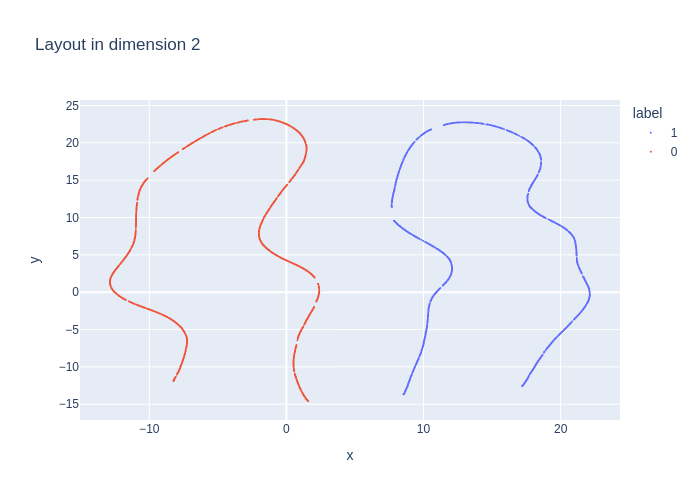

Computing persistence up to dimension 1 and global metrics
done


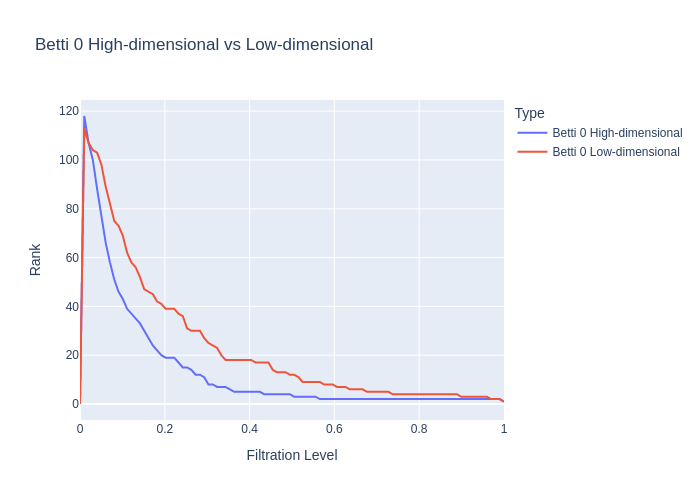

Distance `DTW` for dimension 0: 0.49095014562232436
Distance `TWED` for dimension 0: 0.1691380443188968
Distance `EMD` for dimension 0: 0.0024679903909816847
Distance `Wasserstein` for dimension 0: 0.11461423798628717
Distance `bottleneck` for dimension 0: 3.6794917583465576


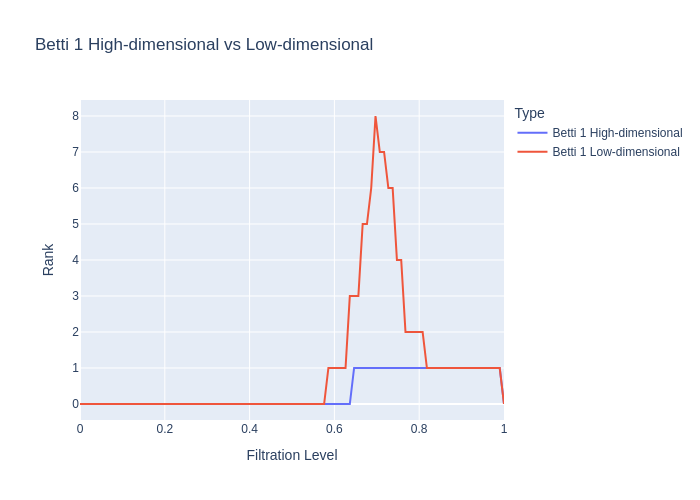

Distance `DTW` for dimension 1: 0.5763439110279289
Distance `TWED` for dimension 1: 0.04688670011174759
Distance `EMD` for dimension 1: 0.024605301326362794
Distance `Wasserstein` for dimension 1: 0.009306896627337915
Distance `bottleneck` for dimension 1: 2.1952762603759766
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.7837030445802953
Neighborhood preservation score (mean, std): [0.39120614528656006, 0.2325848788022995]
Computing context measures
done
Context preservation score (SVM): [0.9073482428115016, 1.0, -0.09722895237894716]
Context preservation score (kNN): [1.0, 1.0, 0.0]


In [168]:
red_moons = UMAP(n_components=reducer_moons.dimension,
                 n_neighbors=reducer_moons.n_neighbors,
                 min_dist=reducer_moons.min_dist,
                 spread=reducer_moons.spread)
#
viz_benchmark(red_moons,
              features_moons,
              labels=labels_moons,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [169]:
benchmark = run_benchmark(red_moons,
                          features_moons,
                          labels=labels_moons,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_moons['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

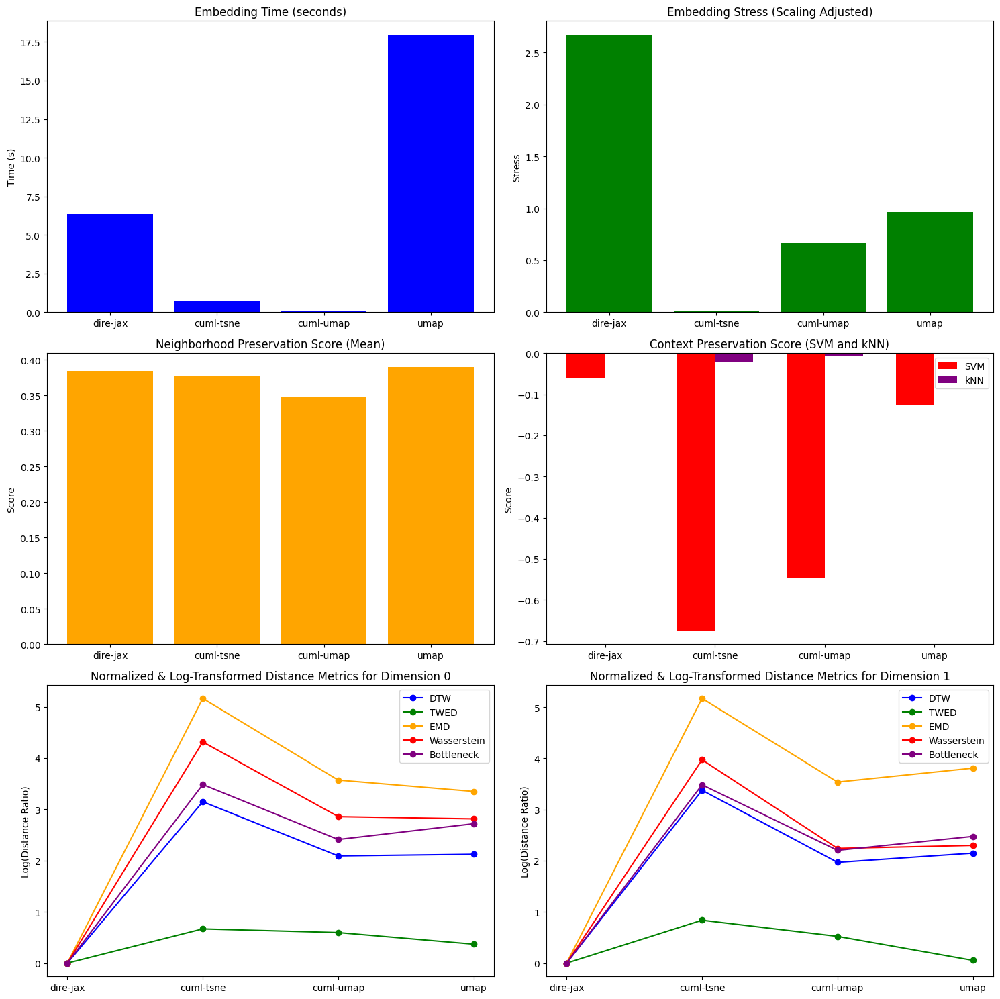

In [170]:
plot_algorithm_comparison(benchmarks_moons)

## Dataset "Levine 13"

In [96]:
exprs_l13 = DataLoader.load_dataset(dataset = "levine13", force_download=True)
exprs_l13.preprocess(arcsinh=True)
##
mask = exprs_l13.cell_types!= 'unassigned'
##
features_l13 = exprs_l13.expression_matrix[mask,:]
labels_l13   = exprs_l13.cell_types[mask]


Download in progress...
This may take quite a while, go grab a coffee or cytomulate it!

Runinng Arcsinh transformation...


### DiRe reducer

In [97]:
reducer_l13 = DiRe(dimension=2,
                   n_neighbors=64,
                   init_embedding_type='pca',
                   max_iter_layout=64,
                   min_dist=1e-4,
                   spread=1.0,
                   cutoff=4.0,
                   n_sample_dirs=16,
                   sample_size=16,
                   neg_ratio=4,
                   verbose=False,)

100%|██████████| 64/64 [00:07<00:00,  8.20it/s]


Embedding time: 9.4791 seconds


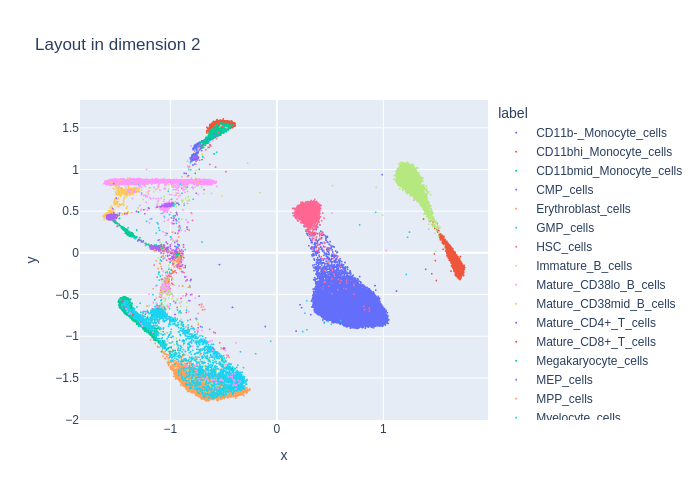

Computing persistence up to dimension 1 and global metrics
done


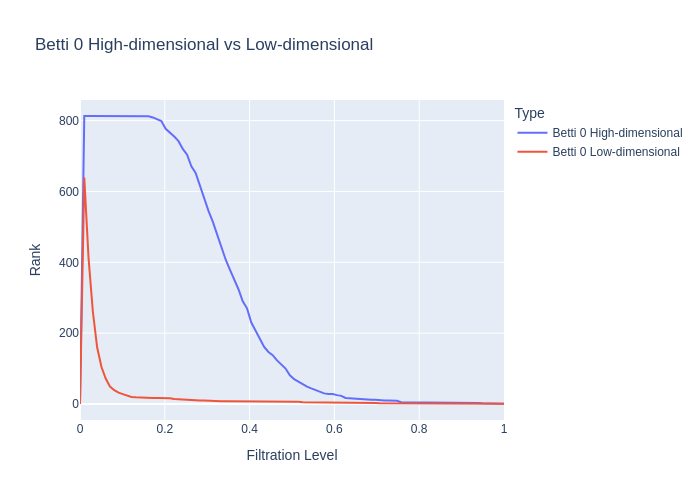

Distance `DTW` for dimension 0: 0.6085131706564397
Distance `TWED` for dimension 0: 0.16622259847357504
Distance `EMD` for dimension 0: 0.0013071222810048624
Distance `Wasserstein` for dimension 0: 0.12441156493047978
Distance `bottleneck` for dimension 0: 2.4786925315856934


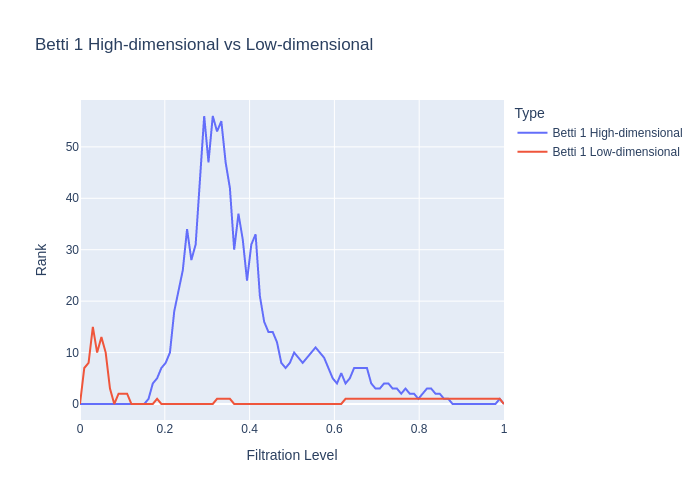

Distance `DTW` for dimension 1: 0.1431868393538009
Distance `TWED` for dimension 1: 0.04283931451442438
Distance `EMD` for dimension 1: 0.0022850735915097183
Distance `Wasserstein` for dimension 1: 0.0059615758684678655
Distance `bottleneck` for dimension 1: 0.5965867042541504
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.57591073678835
Neighborhood preservation score (mean, std): [0.005046817008405924, 0.01152888499200344]
Computing context measures
done
Context preservation score (SVM): [0.9543086172344689, 0.8416833667334669, -0.1255832227753485]
Context preservation score (kNN): [0.946177370030581, 0.9421406727828746, -0.004275448632312281]


In [98]:
viz_benchmark(reducer_l13,
              features_l13,
              labels=labels_l13,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [99]:
benchmarks_l13 = {}

In [100]:
benchmark = run_benchmark(reducer_l13,
                          features_l13,
                          labels=labels_l13,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l13['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 64/64 [00:05<00:00, 11.65it/s]


### CuML tSNE reducer

[W] [18:12:58.816362] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
Embedding time: 1.4199 seconds


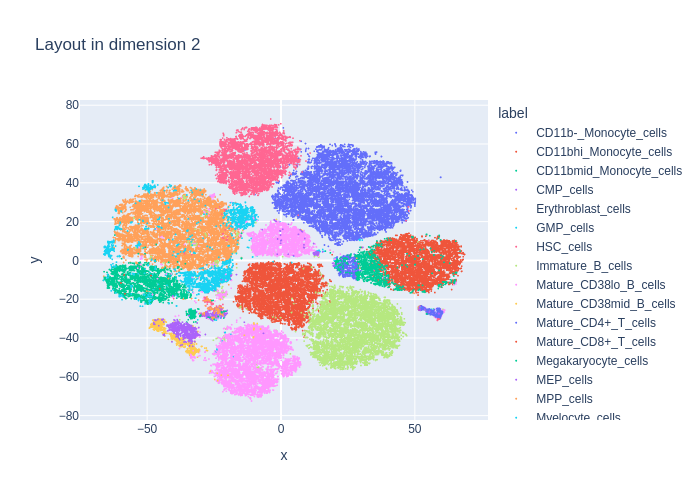

Computing persistence up to dimension 1 and global metrics
done


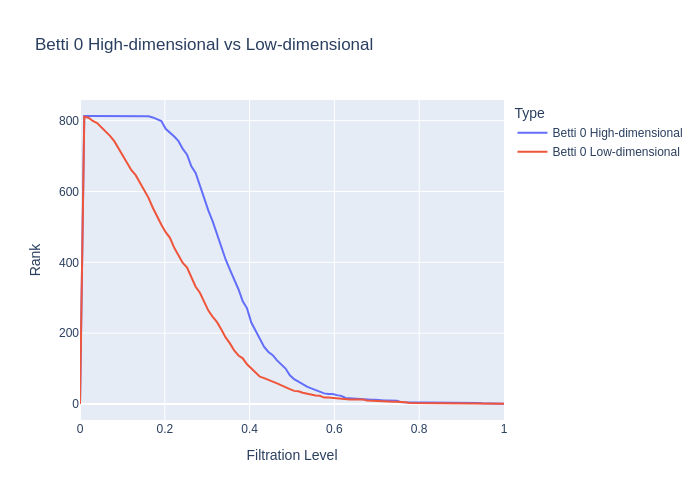

Distance `DTW` for dimension 0: 0.055380835684283446
Distance `TWED` for dimension 0: 0.0726557186212948
Distance `EMD` for dimension 0: 0.00010414009314252664
Distance `Wasserstein` for dimension 0: 0.07310762700035671
Distance `bottleneck` for dimension 0: 4.462264060974121


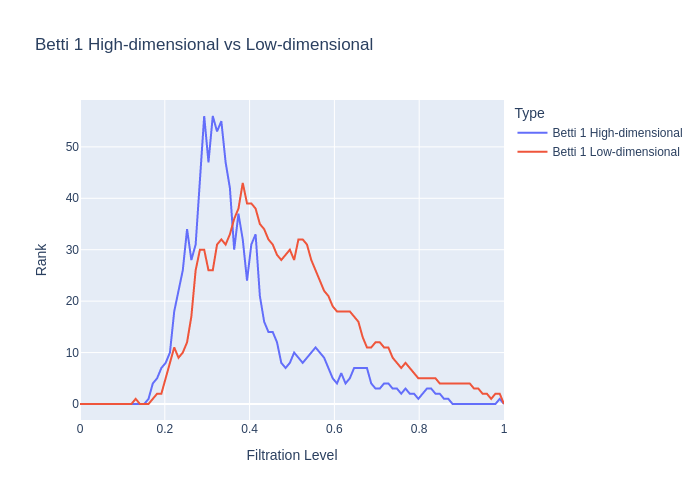

Distance `DTW` for dimension 1: 0.08307155712184892
Distance `TWED` for dimension 1: 0.034698501007094755
Distance `EMD` for dimension 1: 0.0007263450569858576
Distance `Wasserstein` for dimension 1: 0.021401461449733802
Distance `bottleneck` for dimension 1: 2.939570903778076
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 6.964481916010672
Neighborhood preservation score (mean, std): [0.050447978079319, 0.056560713797807693]
Computing context measures
done
Context preservation score (SVM): [0.9543086172344689, 0.7771543086172344, -0.205348191244211]
Context preservation score (kNN): [0.9549439347604485, 0.9651783893985729, 0.010660312034682646]


In [101]:
tred_l13 = cTSNE(n_components=2,
                  method='fft',
                  perplexity=25,
                  n_neighbors=3*25+1)
#
viz_benchmark(tred_l13,
              features_l13,
              labels=labels_l13,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [102]:
benchmark = run_benchmark(tred_l13,
                          features_l13,
                          labels=labels_l13,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l13['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

[W] [18:14:34.548694] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


### CuML UMAP reducer

Embedding time: 0.8976 seconds


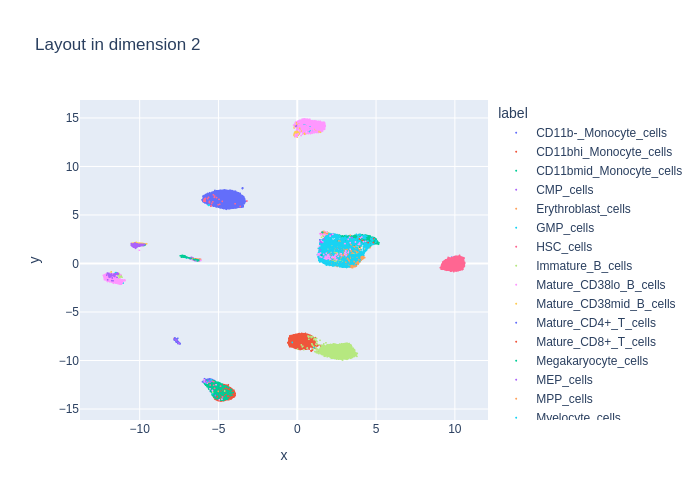

Computing persistence up to dimension 1 and global metrics
done


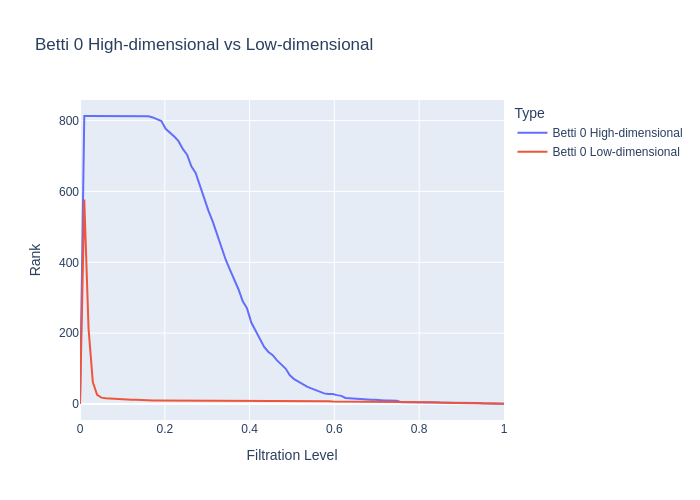

Distance `DTW` for dimension 0: 0.8880824597660447
Distance `TWED` for dimension 0: 0.1902530848148524
Distance `EMD` for dimension 0: 0.0019120929879735758
Distance `Wasserstein` for dimension 0: 0.12758631444092064
Distance `bottleneck` for dimension 0: 2.0423669815063477


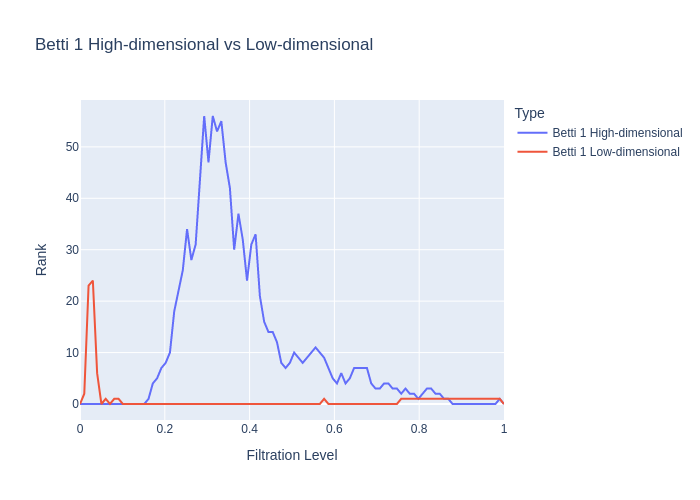

Distance `DTW` for dimension 1: 0.07661123067646755
Distance `TWED` for dimension 1: 0.04570407326144631
Distance `EMD` for dimension 1: 0.004179490811901337
Distance `Wasserstein` for dimension 1: 0.006586626848558251
Distance `bottleneck` for dimension 1: 1.234006643295288
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 3.453306381822146
Neighborhood preservation score (mean, std): [0.008639061823487282, 0.01592838764190674]
Computing context measures
done
Context preservation score (SVM): [0.9543086172344689, 0.8428857715430862, -0.12415567078416295]
Context preservation score (kNN): [0.946177370030581, 0.9480937818552497, 0.0020233771459649903]


In [103]:
cured_l13 = cUMAP(n_components=reducer_l13.dimension,
                  n_neighbors=reducer_l13.n_neighbors,
                  min_dist=reducer_l13.min_dist,
                  spread=reducer_l13.spread)
#
viz_benchmark(cured_l13,
              features_l13,
              labels=labels_l13,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [104]:
benchmark = run_benchmark(cured_l13,
                          features_l13,
                          labels=labels_l13,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l13['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 71.5856 seconds


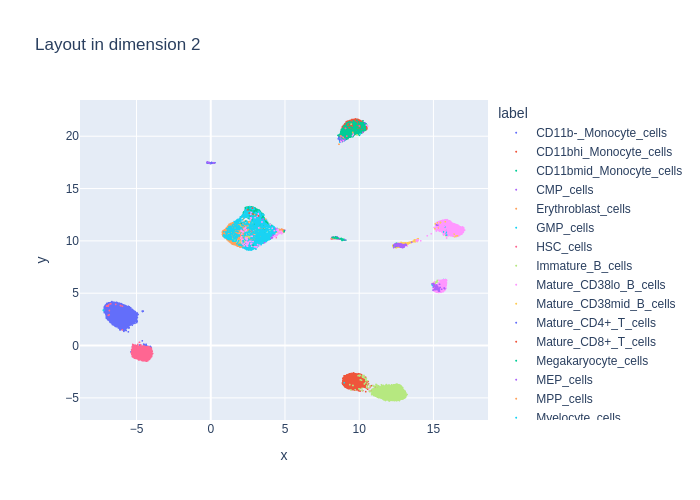

Computing persistence up to dimension 1 and global metrics
done


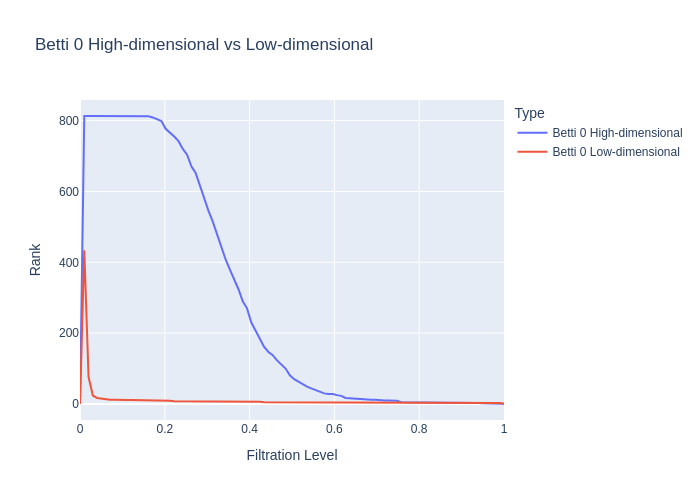

Distance `DTW` for dimension 0: 1.407495071582634
Distance `TWED` for dimension 0: 0.19770832804890423
Distance `EMD` for dimension 0: 0.004260287620855635
Distance `Wasserstein` for dimension 0: 0.12824397223418393
Distance `bottleneck` for dimension 0: 4.674341678619385


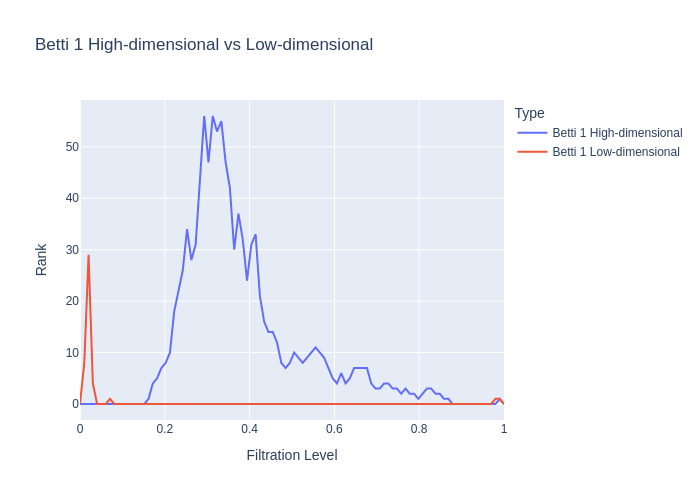

Distance `DTW` for dimension 1: 0.08352808045600019
Distance `TWED` for dimension 1: 0.046667116430300026
Distance `EMD` for dimension 1: 0.006815762124005353
Distance `Wasserstein` for dimension 1: 0.006458345294814611
Distance `bottleneck` for dimension 1: 0.5965867042541504
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 5.900878716731767
Neighborhood preservation score (mean, std): [0.009686928242444992, 0.01753258891403675]
Computing context measures
done
Context preservation score (SVM): [0.9543086172344689, 0.795190380761523, -0.18240555864204464]
Context preservation score (kNN): [0.946177370030581, 0.9549439347604485, 0.009222585476432116]


In [105]:
red_l13 = UMAP(n_components=reducer_l13.dimension,
               n_neighbors=reducer_l13.n_neighbors,
               min_dist=reducer_l13.min_dist,
               spread=reducer_l13.spread)
#
viz_benchmark(red_l13,
              features_l13,
              labels=labels_l13,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [106]:
benchmark = run_benchmark(red_l13,
                          features_l13,
                          labels=labels_l13,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l13['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

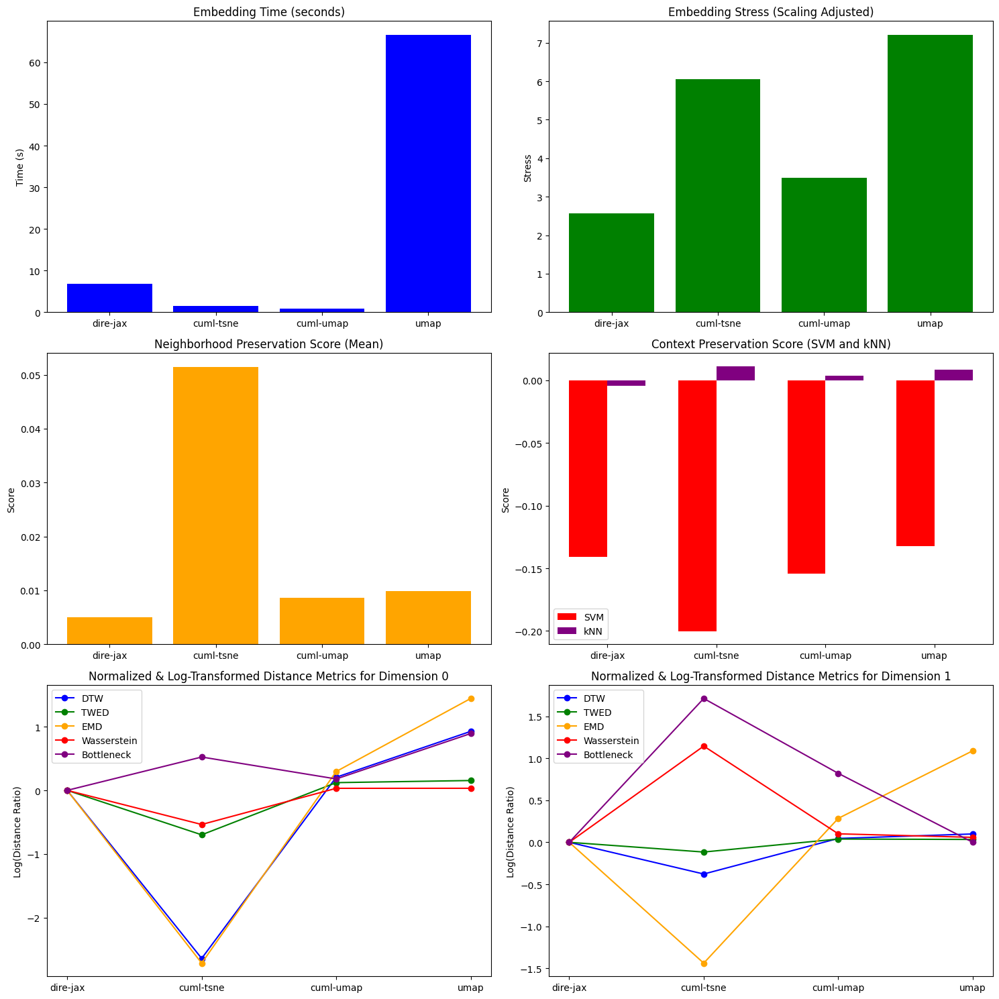

In [107]:
plot_algorithm_comparison(benchmarks_l13)

## Dataset "Levine 32"

In [108]:
exprs_l32 = DataLoader.load_dataset(dataset = "levine32", force_download=True)
exprs_l32.preprocess(arcsinh=True)
##
mask = exprs_l32.cell_types!= 'unassigned'
##
features_l32 = exprs_l32.expression_matrix[mask,:]
labels_l32   = exprs_l32.cell_types[mask]


Download in progress...
This may take quite a while, go grab a coffee or cytomulate it!

Runinng Arcsinh transformation...


### DiRe reducer

In [109]:
reducer_l32 = DiRe(dimension=2,
                   n_neighbors=64,
                   init_embedding_type='random',
                   max_iter_layout=64,
                   min_dist=1e-4,
                   spread=1.0,
                   cutoff=4.0,
                   n_sample_dirs=16,
                   sample_size=16,
                   neg_ratio=16,
                   verbose=False,)

100%|██████████| 64/64 [00:09<00:00,  6.89it/s]


Embedding time: 11.3960 seconds


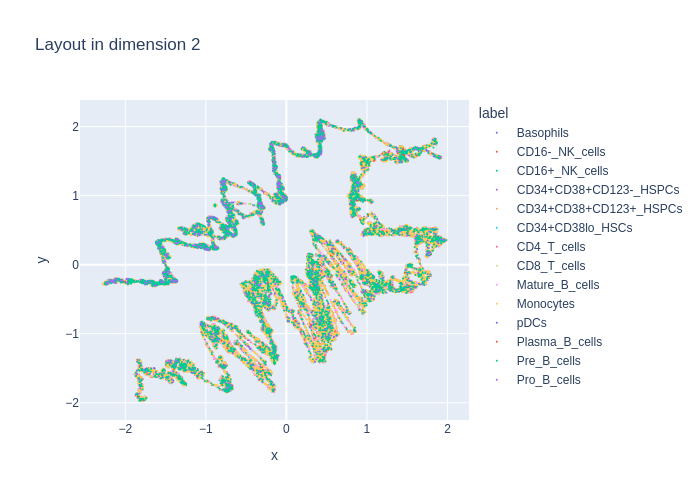

Computing persistence up to dimension 1 and global metrics
done


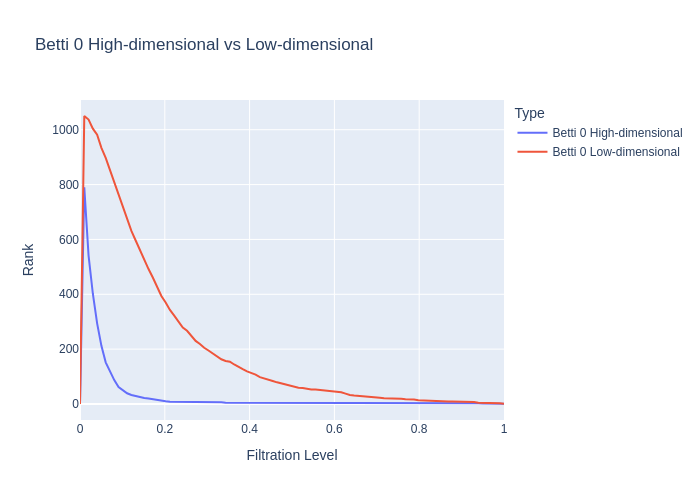

Distance `DTW` for dimension 0: 193.87271992233227
Distance `TWED` for dimension 0: 0.1919011601875656
Distance `EMD` for dimension 0: 2.236412573056049
Distance `Wasserstein` for dimension 0: 102.37868954829185
Distance `bottleneck` for dimension 0: 20301.314453125


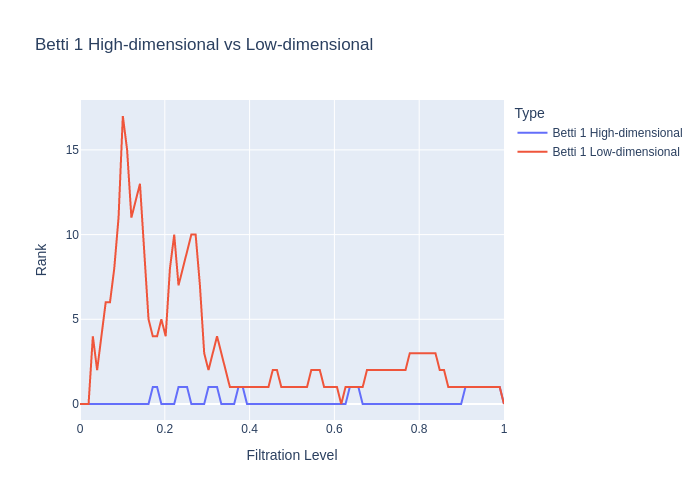

Distance `DTW` for dimension 1: 25.36916422149162
Distance `TWED` for dimension 1: 0.026668775033850685
Distance `EMD` for dimension 1: 4.4494212596575435
Distance `Wasserstein` for dimension 1: 0.08153473825315144
Distance `bottleneck` for dimension 1: 257.005126953125
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.62051953231574
Neighborhood preservation score (mean, std): [0.0444391705095768, 0.06131498143076897]
Computing context measures
done
Context preservation score (SVM): [0.989821882951654, 0.25190839694656486, -1.3684594934838565]
Context preservation score (kNN): [0.9750127975428717, 0.23569874584079856, -1.4198961076666587]


In [110]:
viz_benchmark(reducer_l32,
              features_l32,
              labels=labels_l32,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2,)

In [111]:
benchmarks_l32 = {}

In [112]:
benchmark = run_benchmark(reducer_l32,
                          features_l32,
                          labels=labels_l32,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l32['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 64/64 [00:06<00:00, 10.42it/s]


### CuML tSNE reducer

[W] [18:30:22.471103] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
Embedding time: 2.0369 seconds


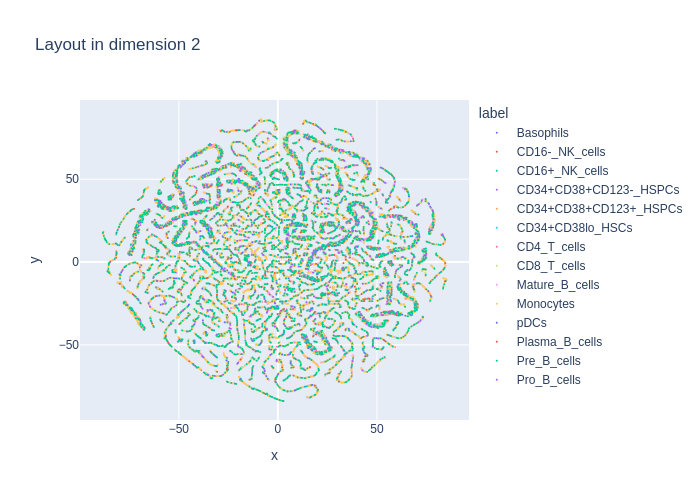

Computing persistence up to dimension 1 and global metrics
done


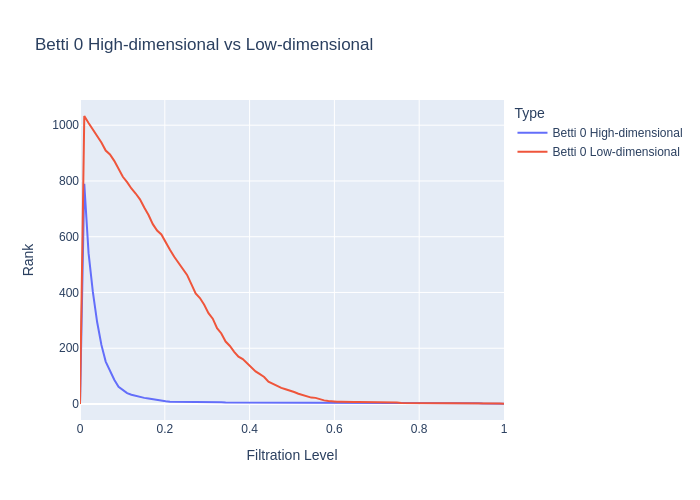

Distance `DTW` for dimension 0: 193.84068801609146
Distance `TWED` for dimension 0: 0.185768402676292
Distance `EMD` for dimension 0: 2.6230429508955395
Distance `Wasserstein` for dimension 0: 102.5708406930883
Distance `bottleneck` for dimension 0: 20301.314453125


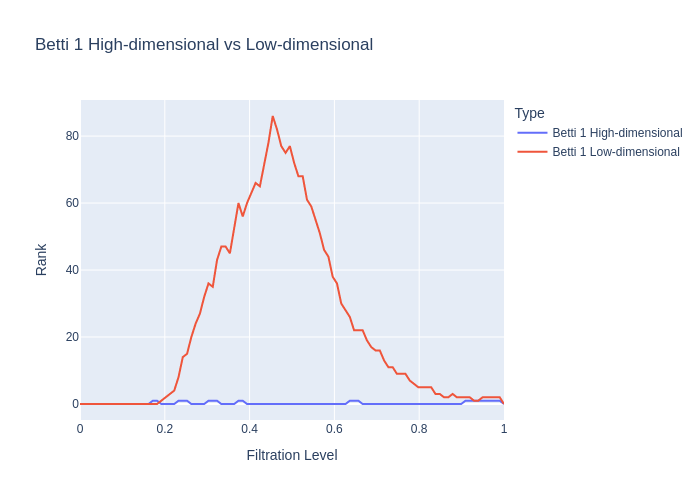

Distance `DTW` for dimension 1: 25.291513717068185
Distance `TWED` for dimension 1: 0.03698954734212457
Distance `EMD` for dimension 1: 32.1257285676875
Distance `Wasserstein` for dimension 1: 0.10738710418655742
Distance `bottleneck` for dimension 1: 257.005126953125
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 4.845982335898635
Neighborhood preservation score (mean, std): [0.218743696808815, 0.16939319670200348]
Computing context measures
done
Context preservation score (SVM): [0.989821882951654, 0.25159033078880405, -1.3697229175306285]
Context preservation score (kNN): [0.9774763245456872, 0.23361914512413617, -1.43128186668977]


In [113]:
tred_l32 = cTSNE(n_components=2,
                  method='fft',
                  perplexity=25,
                  n_neighbors=3*25+1)
#
viz_benchmark(tred_l32,
              features_l32,
              labels=labels_l32,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [114]:
benchmark = run_benchmark(tred_l32,
                          features_l32,
                          labels=labels_l32,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l32['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

[W] [18:32:23.825185] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


### CuML UMAP reducer

Embedding time: 1.4515 seconds


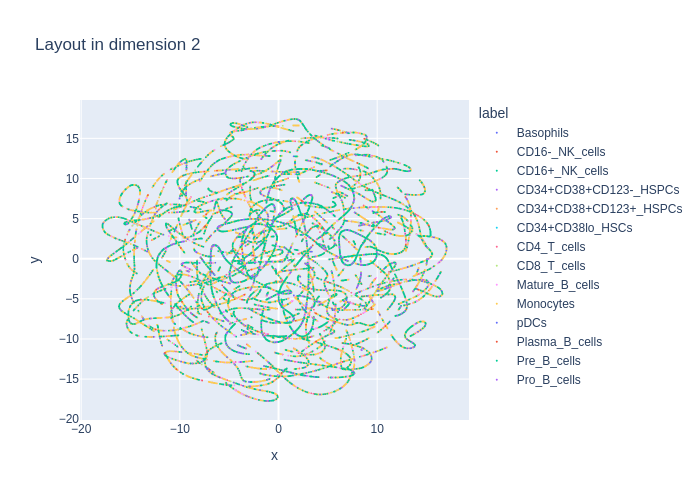

Computing persistence up to dimension 1 and global metrics
done


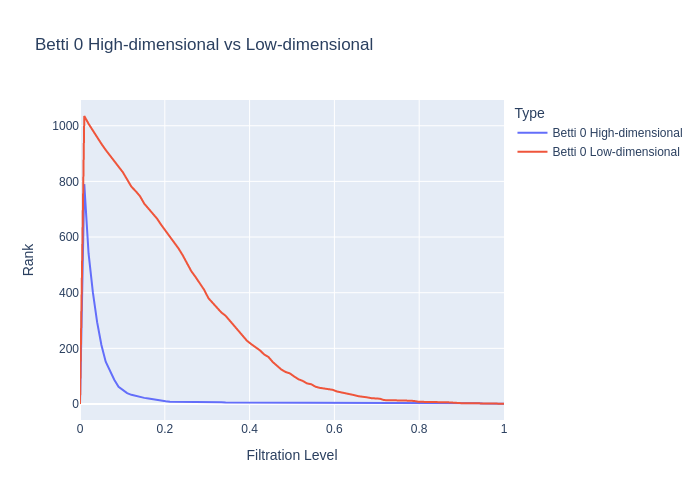

Distance `DTW` for dimension 0: 193.89480454234217
Distance `TWED` for dimension 0: 0.19237473894335153
Distance `EMD` for dimension 0: 2.967559941708524
Distance `Wasserstein` for dimension 0: 102.41395598787167
Distance `bottleneck` for dimension 0: 20301.314453125


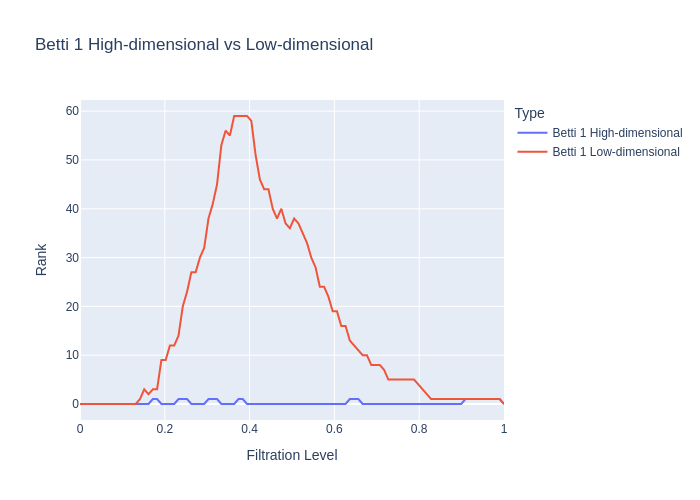

Distance `DTW` for dimension 1: 25.353110249047518
Distance `TWED` for dimension 1: 0.03084107959832506
Distance `EMD` for dimension 1: 23.26460189274905
Distance `Wasserstein` for dimension 1: 0.08620824996766728
Distance `bottleneck` for dimension 1: 257.005126953125
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 5.754464467740815
Neighborhood preservation score (mean, std): [0.12350700050592422, 0.14803338050842285]
Computing context measures
done
Context preservation score (SVM): [0.989821882951654, 0.25286259541984735, -1.36467877064395]
Context preservation score (kNN): [0.9750127975428717, 0.23461095469669824, -1.4245219662556727]


In [115]:
cured_l32 = cUMAP(n_components=reducer_l32.dimension,
                  n_neighbors=reducer_l32.n_neighbors,
                  min_dist=reducer_l32.min_dist,
                  spread=reducer_l32.spread)
#
viz_benchmark(cured_l32,
              features_l32,
              labels=labels_l32,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [116]:
benchmark = run_benchmark(cured_l32,
                          features_l32,
                          labels=labels_l32,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l32['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 43.5837 seconds


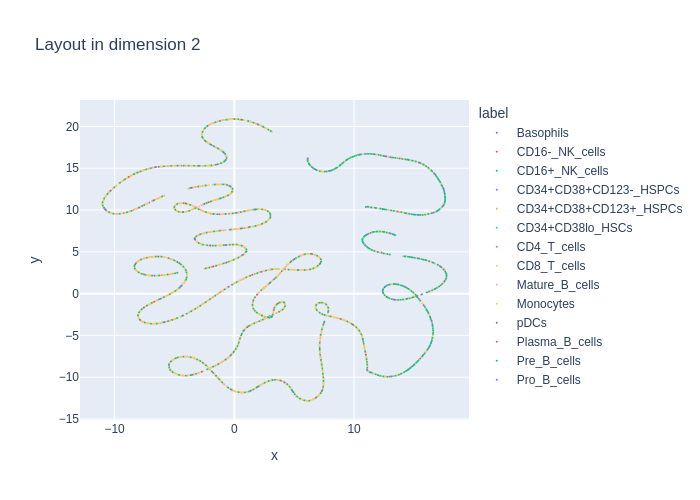

Computing persistence up to dimension 1 and global metrics
done


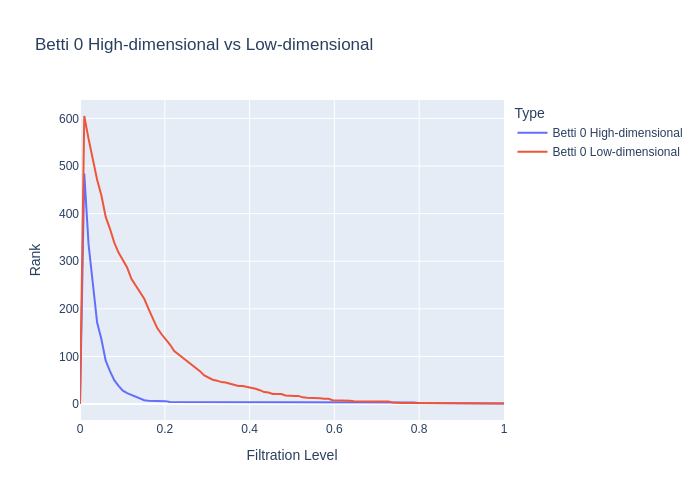

Distance `DTW` for dimension 0: 1244.0949415152734
Distance `TWED` for dimension 0: 0.4681811168527639
Distance `EMD` for dimension 0: 10.204981412303006
Distance `Wasserstein` for dimension 0: 394.07138597317095
Distance `bottleneck` for dimension 0: 32520.513671875


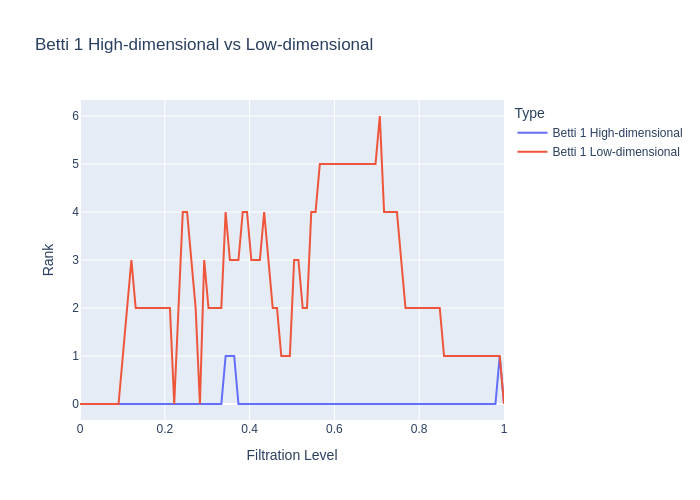

Distance `DTW` for dimension 1: 135.68490188973192
Distance `TWED` for dimension 1: 0.08956626069025858
Distance `EMD` for dimension 1: 83.12167179911658
Distance `Wasserstein` for dimension 1: 0.08956177040831755
Distance `bottleneck` for dimension 1: 61.9501953125
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 15.67979604467156
Neighborhood preservation score (mean, std): [0.406108021736145, 0.287984699010849]
Computing context measures
done
Context preservation score (SVM): [0.9796178343949045, 0.2751592356687898, -1.2698125618214788]
Context preservation score (kNN): [0.9526551503518874, 0.22296865003198976, -1.4522218024834304]


In [117]:
features_l32_sub = features_l32[::10]
labels_l32_sub   = labels_l32[::10]
#
red_l32 = UMAP(n_components=reducer_l32.dimension,
               n_neighbors=reducer_l32.n_neighbors,
               min_dist=reducer_l32.min_dist,
               spread=reducer_l32.spread)
#
viz_benchmark(red_l32,
              features_l32_sub,
              labels=labels_l32_sub,
              dimension=1,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [118]:
benchmark = run_benchmark(red_l32,
                          features_l32_sub,
                          labels=labels_l32_sub,
                          dimension=1,
                          subsample_threshold=0.25,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l32['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

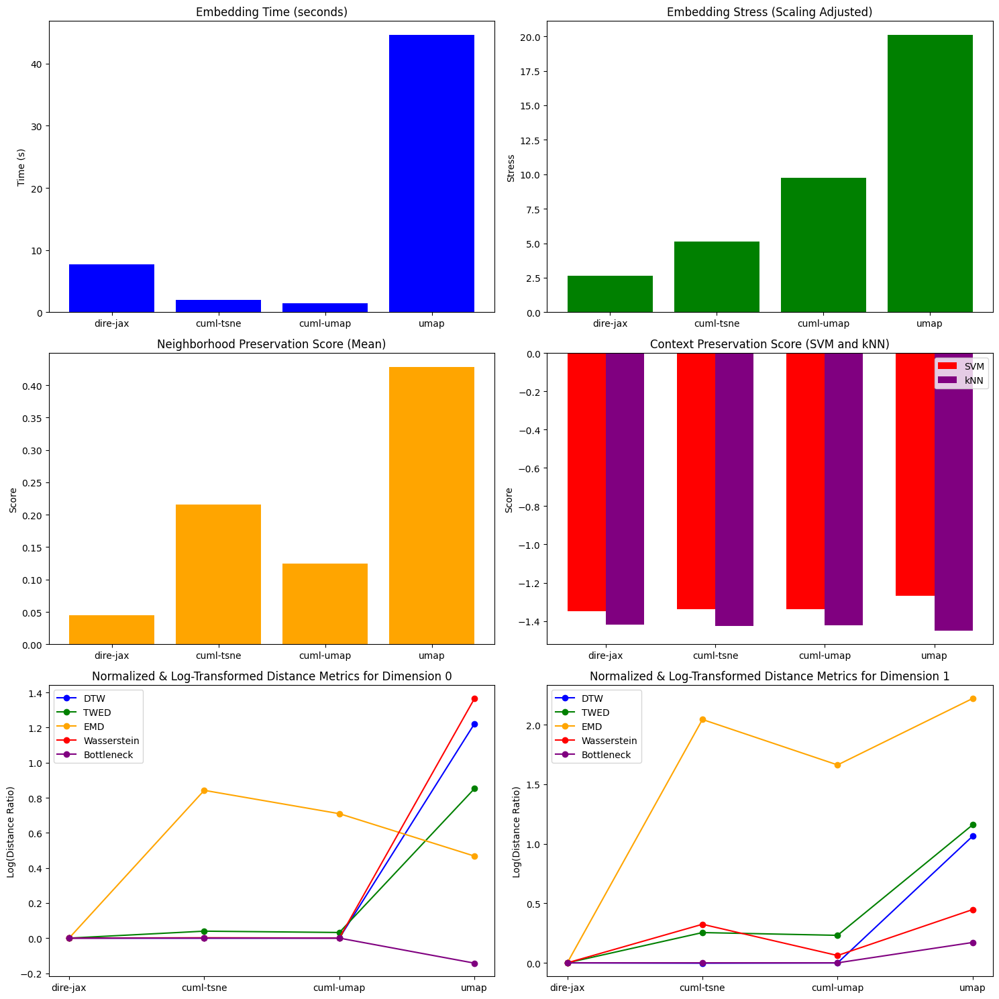

In [119]:
plot_algorithm_comparison(benchmarks_l32)